In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
!pip install wordcloud matplotlib
from wordcloud import WordCloud
from collections import Counter
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import nltk


nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
df = pd.read_csv(r'D:\Midah\Data Analyst\Rakamin Academy\FinPro\Dataset/train_data.csv')

In [5]:
# Ubah nama kolom menjadi lowercase
df.columns = df.columns.str.lower()

In [7]:
# Menambahkan kolom baru untuk panjang kalimat
df['sentence_length'] = df['new_sentence'].apply(lambda x: len(str(x)) if pd.notnull(x) else 0)

# Menampilkan 5 baris pertama hasilnya
print(df[['new_sentence', 'sentence_length']].head())

                                        new_sentence  sentence_length
0  Author and/or Review architecture/design and o...              173
1  Should be able to develop custom dynamic shape...              104
2  Experience in working crosslly with a  larger ...              105
3  Previous business experience, including but no...              150
4         Delivering fast and right the first  time.               42


In [9]:
df.head(3)

,unnamed: 0,sentence_id,new_sentence,type,sentence_length
0,0,GERRES15609,Author and/or Review architecture/design and o...,Responsibility,173
1,1,PHERES15784,Should be able to develop custom dynamic shape...,Responsibility,104
2,2,GERREQ10457,Experience in working crosslly with a larger ...,Requirement,105


## OVERVIEW DATASET

#### 1. LATAR BELAKANG
PT X merupakan perusahaan yang bergerak di layanan CRM atau HR Tech menghadapi tantangan besar dalam menciptakan proses rekrutmen yang efisien dan berbasis data untuk mendukung kebutuhan perusahaan (hiring partner) sekaligus memenuhi harapan kandidat (user). Hambatan utama terletak pada deskripsi pekerjaan yang panjang dan tidak terstruktur. Kondisi ini menyulitkan untuk menemukan informasi penting seperti tanggung jawab, keterampilan, dan kualifikasi yang dibutuhkan, sehingga menghambat penilaian kecocokan antara kandidat dan lowongan seca

- Hiring Partner POV: Perusahaan kesulitan menyaring dan menemukan kandidat yang sesuai secara efisien karena volume data pelamar yang besar dan tidak terstruktur

- User POV: Kandidat cenderung kesulitan memahami posisi yang dilamar jika deskripsi pekerjaan terlalu panjang dan sulit dipahami, serta merasa penilaian terhadap mereka kurang objektif.

- HR Tech POV: HR Tech menghadapi tantangan dalam mengelola deskripsi pekerjaan yang tidak terstruktur dan CV kandidat yang tidak seragam untuk memberikan penilaian kecocokan yang objektif serta pengalaman rekrutmen yang efisien .

#### 2. PROBLEM STATMENT 
PT X menghadapi tantangan dalam menciptakan proses rekrutmen yang efisien dan berbasis data. Deskripsi pekerjaan yang panjang dan tidak terstruktur menyulitkan hiring partner untuk menyaring kandidat yang sesuai, sementara kandidat kesulitan memahami posisi yang dilamar. Hal ini menghambat penilaian kecocokan antara kandidat dan lowongan, serta mengurangi objektivitas dalam proses rekrutmen yang dikelola oleh HR Tech.

### 3.GOALS 
Menciptakan proses rekrutmen yang lebih efisien bagi hiring partner dengan meningkatkan kepuasan mereka sebesar 30%, sekaligus meningkatkan tingkat penerimaan kandidat hingga 20% dalam waktu 6 bulan.

#### 4. OBJECTIVE 
Sistem machine learning yang membantu kandidat mendapatkan pekerjaan dan perusahaan menemukan kandidat terbaik dengan menggunakan klasifikasi kalimat dalam deskripsi pekerjaan untuk mengidentifikasi tanggung jawab, keterampilan, dan kualifikasi, serta mencocokkan keduanya berdasarkan skor keterampilan dan penilaian kecocokan.

#### 5. BUSINESS METRICS 
- Hiring Partner Satisfaction Score (HPSS) > 30% : Mengukur tingkat kepuasan hiring partner terhadap proses rekrutmen yang didukung oleh sistem, termasuk efisiensi waktu, kualitas kandidat yang direkomendasikan, dan kemudahan penggunaan platform.
- Candidate Job Palcement Rate (CJPR) Naik 20% : Persentase kandidat yang berhasil ditempatkan di posisi kerja berdasarkan rekomendasi sistem dibandingkan dengan total kandidat yang menggunakan platform.
  
#### 6. INITIATIVES 
- Mengembangkan sistem penilaian CV user secara otomatis untuk merekomendasikan level pekerjaan yang cocok (entry, medium, atau senior level) berdasarkan bidang yang ingin dilamar
- Membangun sistem pengelompokan (levelling) lowongan pekerjaan dari hiring partner berdasarkan tingkat kompleksitas, keterampilan, dan pengalaman yang dibutuhkan.
- Merancang sistem pencocokan otomatis antara CV user dan lowongan kerja, dengan menampilkan skor kecocokan secara transparan.
- Mengembangkan sistem rekomendasi dua arah: merekomendasikan kandidat yang paling sesuai untuk hiring partner dan merekomendasikan perusahaan yang paling cocok untuk user.
- Membuat ringkasan otomatis deskripsi pekerjaan untuk mempermudah kandidat memahami posisi yang dilamar atau HP memhami kandidat.



## DESCRIPTIVE STATISTIC

#### 1. CEK MISSING VALUE 

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60115 entries, 0 to 60114
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   unnamed: 0       60115 non-null  int64 
 1   sentence_id      60115 non-null  object
 2   new_sentence     59002 non-null  object
 3   type             60115 non-null  object
 4   sentence_length  60115 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 2.3+ MB


In [13]:
df.describe(include='all')

,unnamed: 0,sentence_id,new_sentence,type,sentence_length
count,60115.000000,60115,59002,60115,60115.000000
unique,NaN,59704,57991,6,NaN
top,NaN,HONREQ4583,his is a dummy block of text And this is repre...,Responsibility,NaN
freq,NaN,2,852,15561,NaN
mean,30057.000000,NaN,NaN,NaN,88.093454
std,17353.850053,NaN,NaN,NaN,67.456955
min,0.000000,NaN,NaN,NaN,0.000000
25%,15028.500000,NaN,NaN,NaN,50.000000
50%,30057.000000,NaN,NaN,NaN,74.000000
75%,45085.500000,NaN,NaN,NaN,112.000000


**EDA Insight :** 
* In the sentence_id column, the most frequently occurring value is HONREQ4583, appearing 2 times.
* 
In the new_sentence column, the most frequently occurring sentence is "this is a dummy block of text And this is representative of example sentences," appearing 852 times, and this column has 1153 missing values
* 
In the type column, there are 6 categories, with the most frequently occurring category being Responsibility, appearing 15,561 times.



#### 2.CEK FREKUENSI TIAP KATEGORI

In [15]:
df.sample(5)

,unnamed: 0,sentence_id,new_sentence,type,sentence_length
59670,59670,GERRES18435,Lead and create Engineered to Order (ETO) proj...,Responsibility,191
45483,45483,HONSKL30475,Excellent technical knowledge of procurement/...,Skill,55
17708,17708,PHERES25787,Train leaders at all levels of the company on...,Responsibility,140
26832,26832,INDRES8783,Communicate with advertisers and internal sale...,Responsibility,101
8805,8805,UAERES31043,Developing novel concepts and writing proposa...,Responsibility,106


**EDA Insight:** Kolom Unnamed:0 harusnya sebuah index

**To Do List:** Hapus kolom Unnamed:0


In [17]:
df.describe(include=object)

,sentence_id,new_sentence,type
count,60115,59002,60115
unique,59704,57991,6
top,HONREQ4583,his is a dummy block of text And this is repre...,Responsibility
freq,2,852,15561


**Key Findings:**
1. Responsibility: 25.89%
2. Requirement: 23.51%
3. SoftSkill: 15.94%
4. Experience: 15.38%
5. Skill: 11.57%
6. Education: 7.71%

**EDA Insight:**

Class imbalance occurs in minority data, although it is not extreme

**To Do List:** <span style="color:red;">To Be Discussed</span>


#### 3.CEK PERSENTASE MISSING VALUE

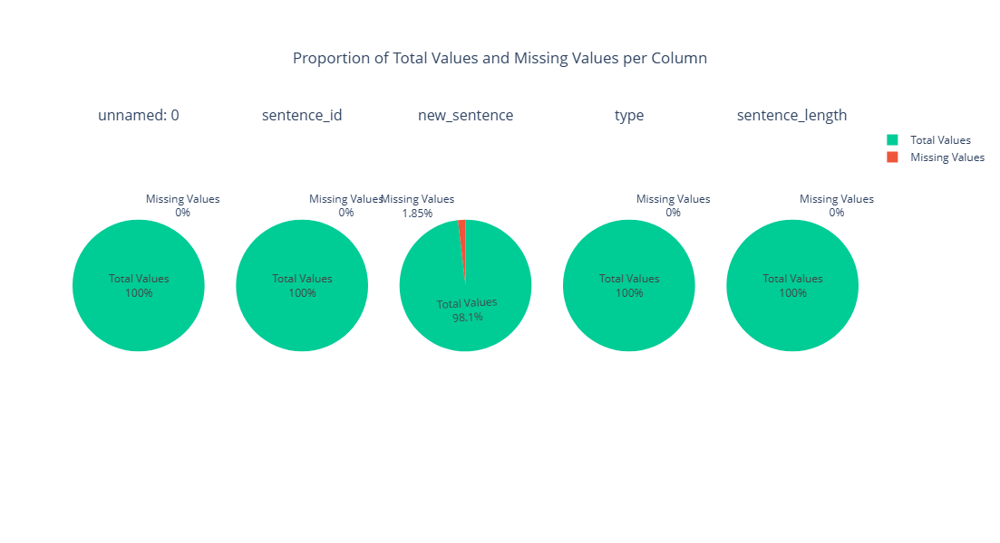

In [19]:
# Membuat subplots dengan tipe domain
fig = make_subplots(rows=1, cols=len(df.columns), subplot_titles=df.columns, specs=[[{'type': 'domain'}] * len(df.columns)])

# Fungsi untuk membuat pie chart persentase total nilai dan nilai yang hilang untuk setiap kolom
def add_pie_chart(fig, df, column, row, col):
    total_values = df[column].count()
    missing_values = df[column].isnull().sum()
    total_cells = len(df[column])
    missing_percentage = (missing_values / total_cells) * 100
    total_percentage = 100 - missing_percentage

    # Menambahkan pie chart ke subplot
    fig.add_trace(go.Pie(
        labels=['Total Values', 'Missing Values'],
        values=[total_percentage, missing_percentage],
        marker=dict(colors=['#00CC96', '#EF553B']),
        textinfo='percent+label'
    ), row=row, col=col)

# Menambahkan pie chart untuk setiap kolom
for i, column in enumerate(df.columns):
    add_pie_chart(fig, df, column, row=1, col=i+1)

# Menambahkan judul dan mengatur ukuran
fig.update_layout(
    title_text='Proportion of Total Values and Missing Values per Column',
    title_x=0.5,  # Menempatkan judul di tengah
    width=1200,  # Lebar keseluruhan plot
    height=600  # Tinggi keseluruhan plot
)

# Menampilkan plot
fig.show()


Based on the visualization above, the column with missing values is new_sentence, with 1.85% missing. Since the amount of missing values is less than 20%, they will be removed.


## UNIVARIATE ANALYSIS

#### 1.DISTRIBUSI KALIMAT

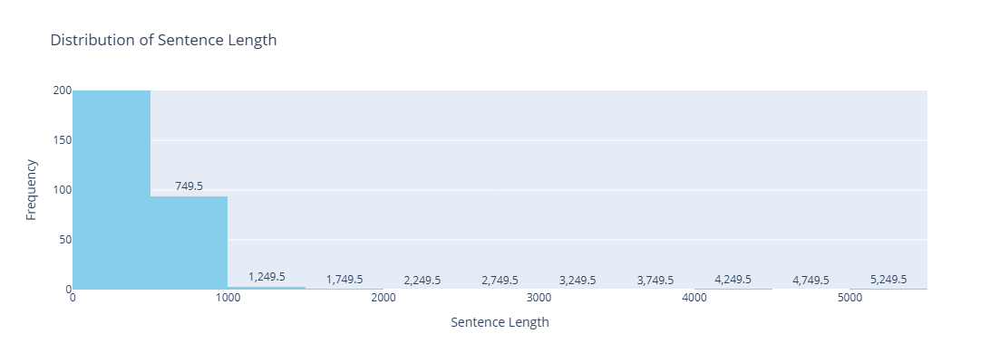

In [21]:
# Membuat histogram
fig = go.Figure(data=[go.Histogram(x=df['sentence_length'], nbinsx=20, marker_color='skyblue')])

# Membuat label di chart
fig.update_traces(texttemplate='%{x}', textposition='outside')

# Menambahkan judul dan label
fig.update_layout(
    title_text='Distribution of Sentence Length',
    xaxis_title_text='Sentence Length',
    yaxis_title_text='Frequency',
    yaxis=dict(range=[0, 200]), # Menyesuaikan rentang sumbu y
    width=1000,  # Lebar histogram
    height=400  # Tinggi histogram
)

# Menampilkan plot
fig.show()

Most sentences have a relatively short length, falling within the lowest sentence length range, which is below 1000 characters. This indicates that the text in the dataset tends to consist of short and concise sentences.


#### 2.FREKUENSI TIAP KATEGORI

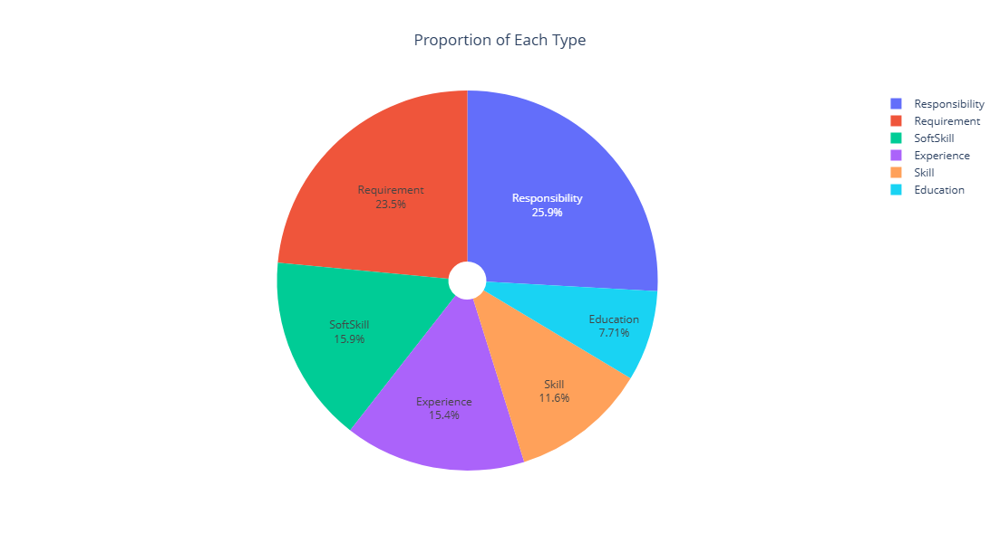

In [23]:
# Menghitung frekuensi setiap kategori dalam kolom 'Type'
type_counts = df['type'].value_counts()

# Membuat pie chart dengan warna solid
fig = go.Figure(data=[go.Pie(
    labels=type_counts.index,
    values=type_counts.values,
    hole=.1,
    marker=dict(colors=['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3'])
)])

# Menambahkan label dalam bentuk persen
fig.update_traces(textinfo='percent+label')

# Menambahkan judul dan mengatur ukuran
fig.update_layout(
    title_text='Proportion of Each Type',
    title_x=0.5, # Atur judul di tengah
    width=800,  # Lebar pie chart
    height=600  # Tinggi pie chart
)

# Menampilkan plot
fig.show()


Based on the results, the most frequently occurring category is Responsibility, accounting for 25.9%. The categories "Skill," "Education," and "Experience" have smaller proportions compared to the top three categories. This may indicate that these aspects are considered supplementary or not heavily emphasized in the dataset.


#### 3.CEK CLASS IMBALANCE

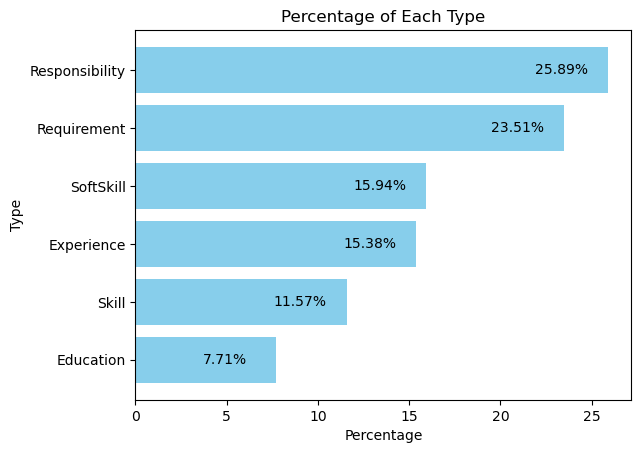

In [57]:
# Menghitung frekuensi setiap kategori dalam kolom 'Type' dalam bentuk persentase
typeuni = df['type'].value_counts(normalize=True) * 100

# Membuat bar chart horizontal
plt.barh(typeuni.index, typeuni, color='skyblue')

# Menambahkan label pada setiap bar dengan padding
for index, value in enumerate(typeuni):
    plt.text(value - 4, index, f'{value:.2f}%', va='center')  # Menambahkan padding 1 unit

# Membalik sumbu y
plt.gca().invert_yaxis()

# Menambahkan judul dan label sumbu
plt.title('Percentage of Each Type')
plt.xlabel('Percentage')
plt.ylabel('Type')

# Menampilkan plot
plt.show()


**EDA Insight:**
Based on the visualization results, there is an imbalance in the classes, although it is not extreme. The class distribution in the target variable shows a slight imbalance, with the majority class accounting for approximately 25.89% of the total data, while the minority class accounts for 7.71%.


#### 4. CEK FREKUENSI KEYWORD (NEW_SENTENCE) TERBANYAK DI TIAP KATEGORI TYPE

In [61]:
#Hapus missing value
df.dropna(subset='new_sentence',inplace=True)

In [63]:
# Mengunduh stopwords jika belum diunduh
nltk.download('stopwords')
nltk.download('punkt')

# Mengatur stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [65]:
# Fungsi untuk membersihkan dan tokenisasi teks
def clean_text(text, custom_stopwords=None):
    # Mengubah teks menjadi huruf kecil
    text = text.lower()
    # Tokenisasi kata
    words = word_tokenize(text)
    # Menghapus stopwords
    if custom_stopwords:
        stop_words.update(custom_stopwords)
    words_cleaned = [word for word in words if word.isalpha() and word not in stop_words]
    return words_cleaned

Analisis untuk kategori: Responsibility


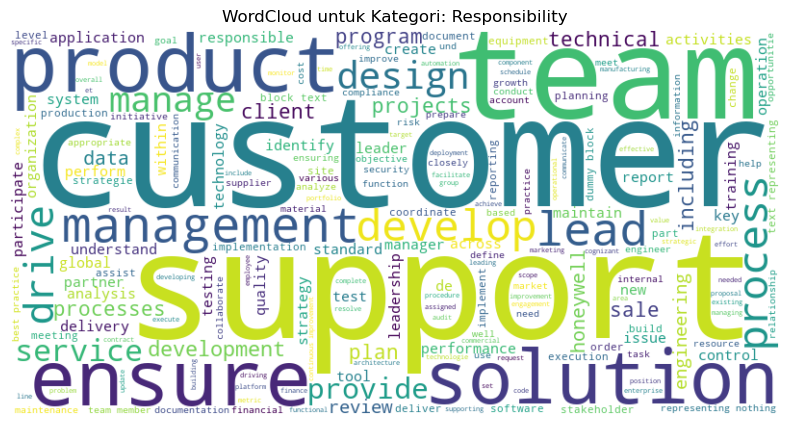

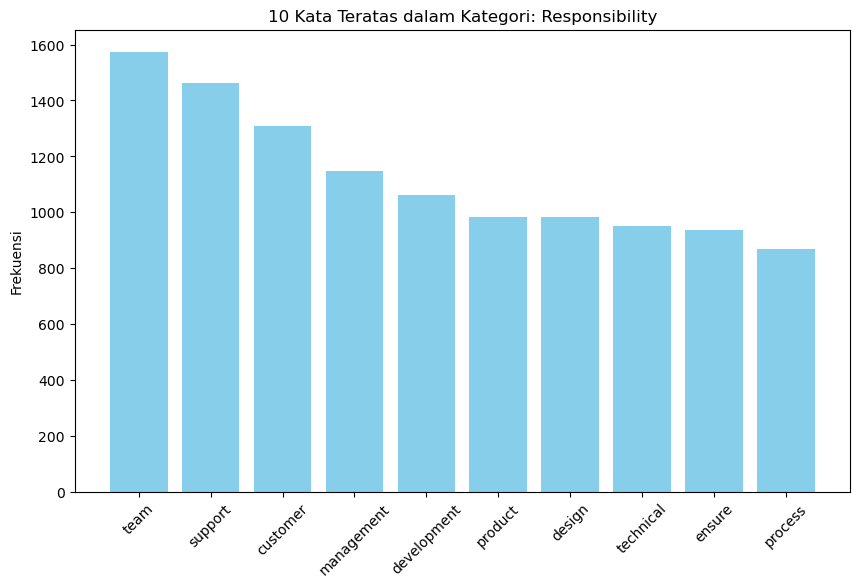

Analisis untuk kategori: Requirement


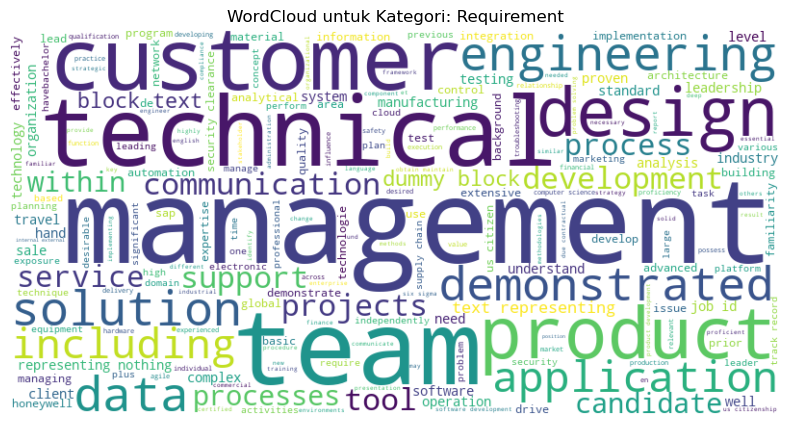

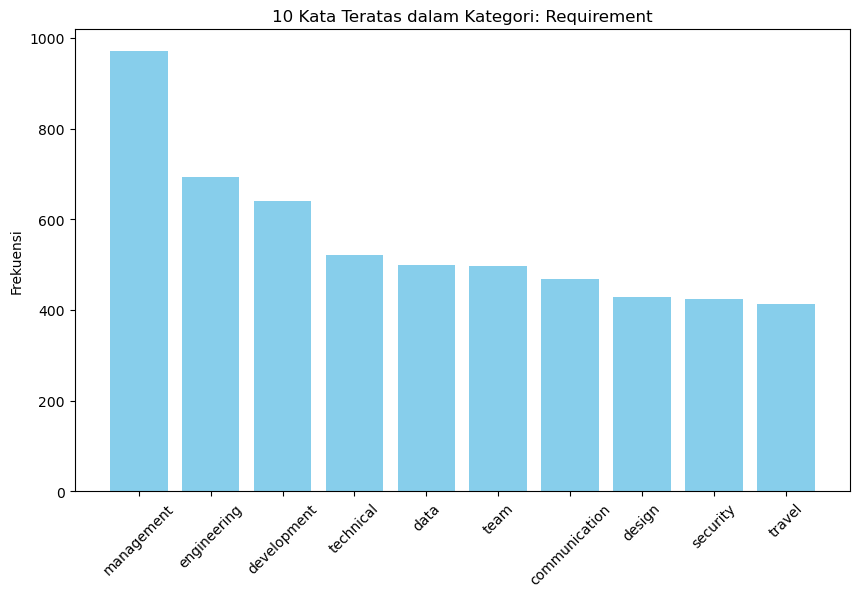

Analisis untuk kategori: Skill


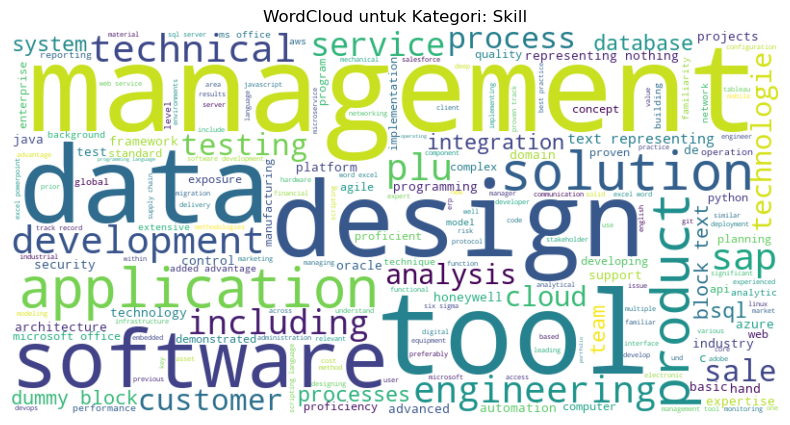

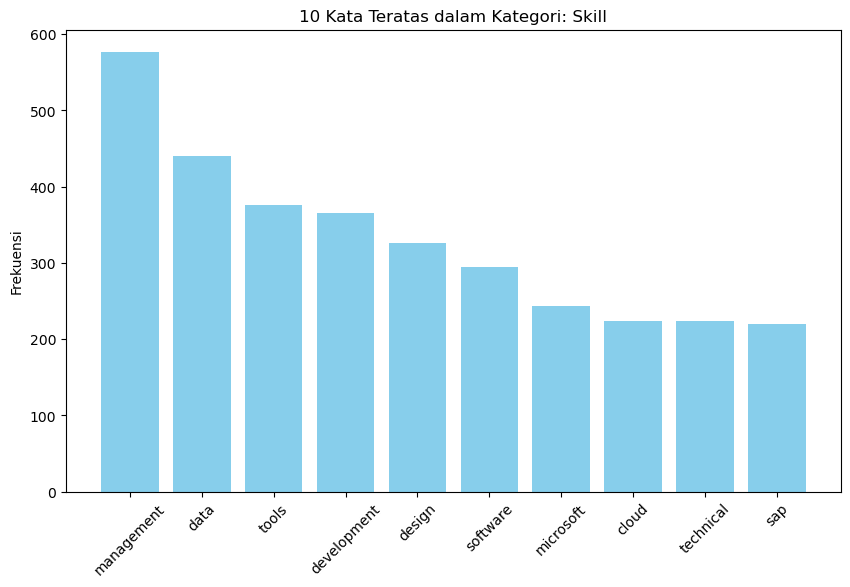

Analisis untuk kategori: SoftSkill


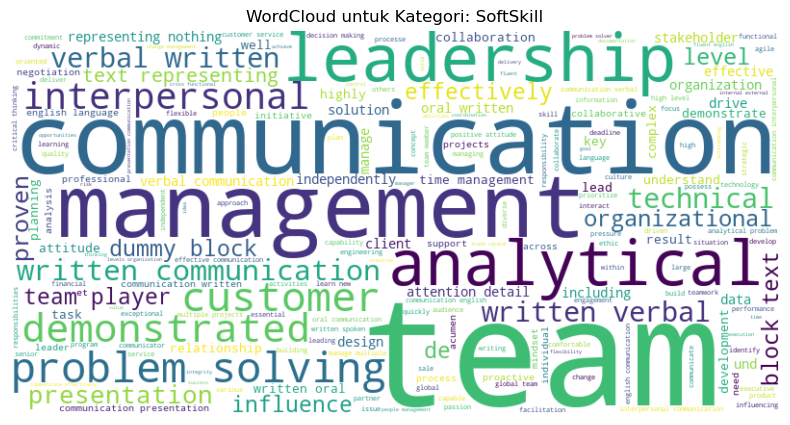

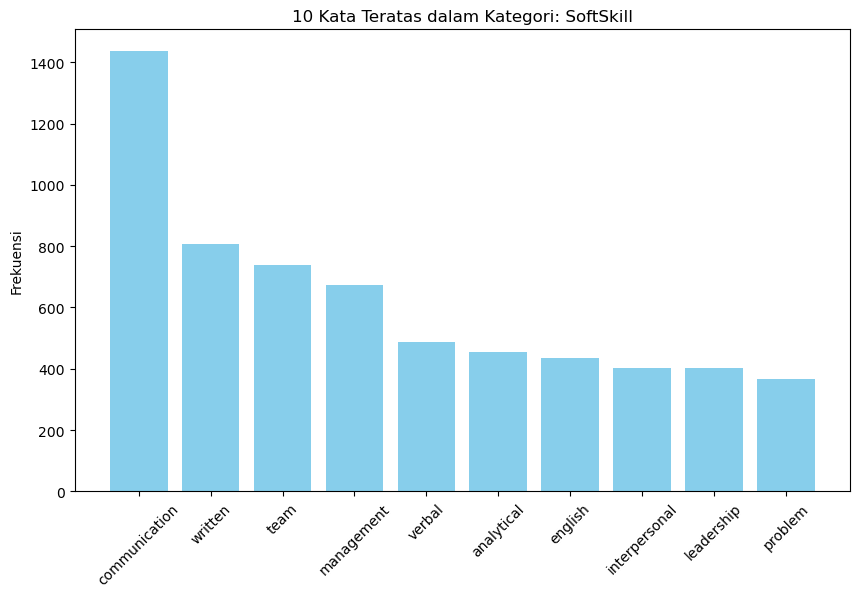

Analisis untuk kategori: Education


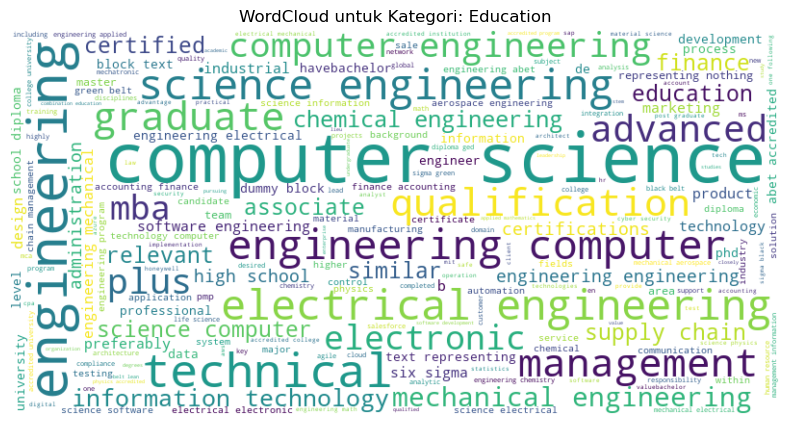

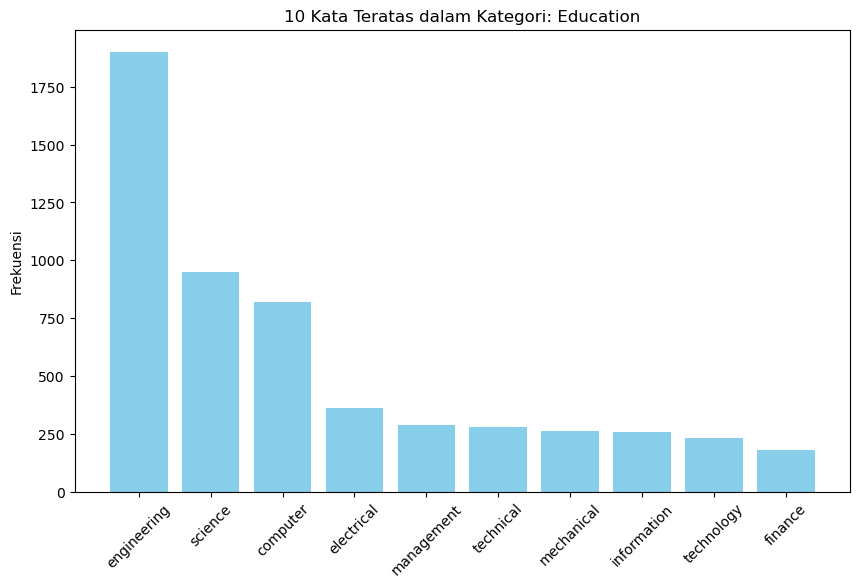

Analisis untuk kategori: Experience


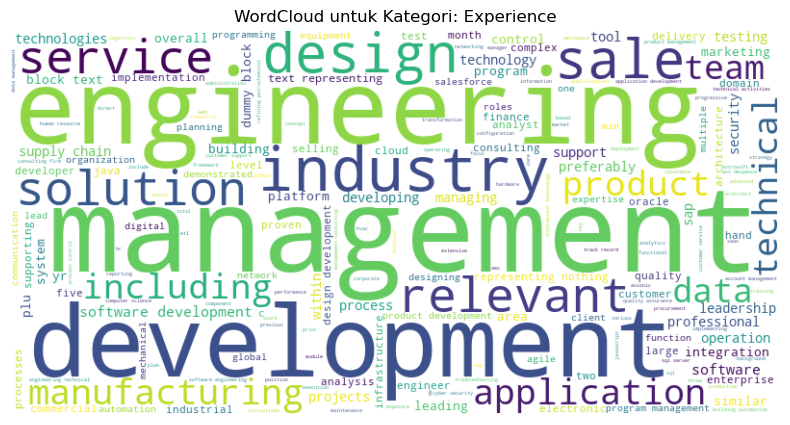

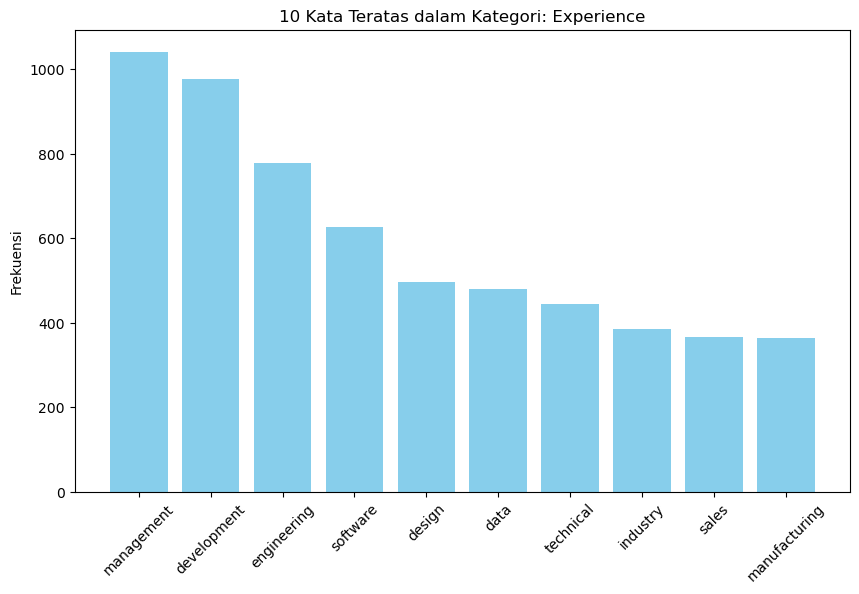

In [75]:
# Fungsi untuk menampilkan WordCloud dan Histogram Frekuensi Kata per kategori
def analyze_category(df, category, custom_stopwords=None):
    """
    Menampilkan WordCloud dan histogram frekuensi kata untuk kategori tertentu.
    Args:
    - df (pd.DataFrame): DataFrame yang berisi teks.
    - category (str): Kategori untuk dianalisis.
    - custom_stopwords (list): Daftar kata tambahan untuk dihapus.
    """
    # Filter data untuk kategori yang diberikan
    filtered_text = ' '.join(df[df['type'] == category]['new_sentence'].dropna())
    
    # Bersihkan teks
    cleaned_words = clean_text(filtered_text, custom_stopwords=custom_stopwords)
    
    if not cleaned_words:
        print(f"Tidak ada kata yang tersisa setelah pembersihan untuk kategori: {category}")
        return
    
    # Membuat WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(cleaned_words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"WordCloud untuk Kategori: {category}")
    plt.show()
    
    # Membuat Histogram Frekuensi Kata
    word_counts = Counter(cleaned_words)
    most_common_words = word_counts.most_common(10)  # Ambil 10 kata yang paling sering muncul
    
    # Menampilkan Histogram
    words, counts = zip(*most_common_words)
    plt.figure(figsize=(10, 6))
    plt.bar(words, counts, color='skyblue')
    plt.title(f"10 Kata Teratas dalam Kategori: {category}")
    plt.ylabel('Frekuensi')
    plt.xticks(rotation=45)
    plt.savefig(f'histogram_{category}.png')
    plt.show()

# Contoh penggunaan
custom_stopwords = {
    'Responsibility': ['work'],
    'Requirement': ['must', 'work', 'strong','required','able','working'],
    'Skill': ['understanding', 'working', 'strong','experience','knowledge','skilss','ability','good','using','etc','requirements'],
    'SoftSkill': ['skills', 'ability', 'strong', 'work', 'good', 'excellent','experince','business','environment'],
    'Education': ['field','degree','bachelors','related','experience','equivalent','certification','preferred','masters','bachelor','systems','discipline'],
    'Experience': ['minimum', 'working', 'least','experience','years','project','role','year']
}

for category, stopwords_to_add in custom_stopwords.items():
    print(f"Analisis untuk kategori: {category}")
    analyze_category(df, category, custom_stopwords=stopwords_to_add)

**Key Finding:**
1. In the Responsibility category, the frequently occurring words are team, support, customer, management, development, product, design, technical, ensure, and process. From these keywords, it can be concluded that this category highly emphasizes interaction patterns, result orientation, and management aspects.
2. Iin the Requirement category, the frequently occurring words are management, engineering, development, technical, data, team, communication, design, security, and travel. From these keywords, it can be concluded that this category highly emphasizes technical qualifications and specific skills
3. In the Education category, the most frequently sought educational backgrounds are engineering, science, and computer.
4. Iin the Experience category, the frequently occurring words are management, engineering, development, software, design, data, technical, industry, sales, and manufacturing. From these keywords, it can be concluded that this category highly emphasizes experience in the STEM fields
5. In the Skill category, the frequently occurring words are management, data, tools, development, design, software, microsoft, cloud, technical, and sap. From these keywords, it can be concluded that this category highly emphasizes technical and analytical skills.
6. in the Softskill category, the frequently occurring words are communication, written, team, management, verbal, analytical, english, interpersonal, leadership, and problem. From these keywords, it can be concluded that this category highly emphasizes communication, leadership, and interpersonal skills

.



In [20]:
# Fungsi untuk menampilkan daftar kata (keyword) per kategori
def analyze_category_keywords(df, category, custom_stopwords=None):
    """
    Menampilkan daftar kata yang sering muncul untuk kategori tertentu.
    Args:
    - df (pd.DataFrame): DataFrame yang berisi teks.
    - category (str): Kategori untuk dianalisis.
    - custom_stopwords (list): Daftar kata tambahan untuk dihapus.
    """
    # Filter data untuk kategori yang diberikan
    filtered_text = ' '.join(df[df['type'] == category]['new_sentence'].dropna())
    
    # Bersihkan teks
    cleaned_words = clean_text(filtered_text, custom_stopwords=custom_stopwords)
    
    if not cleaned_words:
        print(f"Tidak ada kata yang tersisa setelah pembersihan untuk kategori: {category}")
        return []
    
    # Hitung frekuensi kata
    word_counts = Counter(cleaned_words)
    most_common_words = word_counts.most_common(200)  # Ambil 100 kata yang paling sering muncul
    
    # Hasilkan daftar kata
    keywords = [word for word, count in most_common_words]
    return keywords

# Contoh penggunaan
keywords_per_category = {}
for category, stopwords_to_add in custom_stopwords.items():
    print(f"Analisis untuk kategori: {category}")
    keywords = analyze_category_keywords(df, category, custom_stopwords=stopwords_to_add)
    keywords_per_category[category] = keywords
    print(f"Keywords: {keywords}")
    print("-" * 50)


Analisis untuk kategori: Responsibility
Keywords: ['business', 'team', 'support', 'customer', 'management', 'development', 'product', 'design', 'technical', 'ensure', 'process', 'develop', 'sales', 'requirements', 'data', 'provide', 'customers', 'drive', 'projects', 'solutions', 'honeywell', 'teams', 'new', 'lead', 'quality', 'responsible', 'processes', 'including', 'key', 'manage', 'engineering', 'systems', 'system', 'performance', 'within', 'test', 'issues', 'delivery', 'leadership', 'activities', 'software', 'analysis', 'across', 'identify', 'service', 'program', 'planning', 'plan', 'products', 'plans', 'testing', 'client', 'internal', 'role', 'global', 'maintain', 'technology', 'de', 'opportunities', 'services', 'strategy', 'strategic', 'review', 'improvement', 'stakeholders', 'tools', 'growth', 'needs', 'organization', 'create', 'solution', 'marketing', 'reporting', 'operations', 'execution', 'build', 'training', 'cost', 'implementation', 'security', 'control', 'programs', 'implem

## MULTIVARIATE ANALYSIS

#### CEK HUBUNGAN FITUR DAN TARGET MENGGUNAKAN CHI-SQUARE
Jika pval<0.05 maka ada hubungan korelasi dan kausalitas

#### 1.ONE HOT ENCODING

In [21]:
# One-hot encoding menggunakan pandas
one_hot_encoded_data = pd.get_dummies(df, columns=['type'], prefix='type')

# Menampilkan data hasil encoding
one_hot_encoded_data.head()


,unnamed: 0,sentence_id,new_sentence,sentence_length,type_Education,type_Experience,type_Requirement,type_Responsibility,type_Skill,type_SoftSkill
0,0,GERRES15609,Author and/or Review architecture/design and o...,173,False,False,False,True,False,False
1,1,PHERES15784,Should be able to develop custom dynamic shape...,104,False,False,False,True,False,False
2,2,GERREQ10457,Experience in working crosslly with a larger ...,105,False,False,True,False,False,False
3,3,GERSKL27235,"Previous business experience, including but no...",150,False,False,False,False,True,False
4,4,HONSSK18415,Delivering fast and right the first time.,42,False,False,False,False,False,True


Uji chi-square untuk kategori: Responsibility
Chi-square: 166.33091267660274
P-value: 1.0
Degree of Freedom: 495


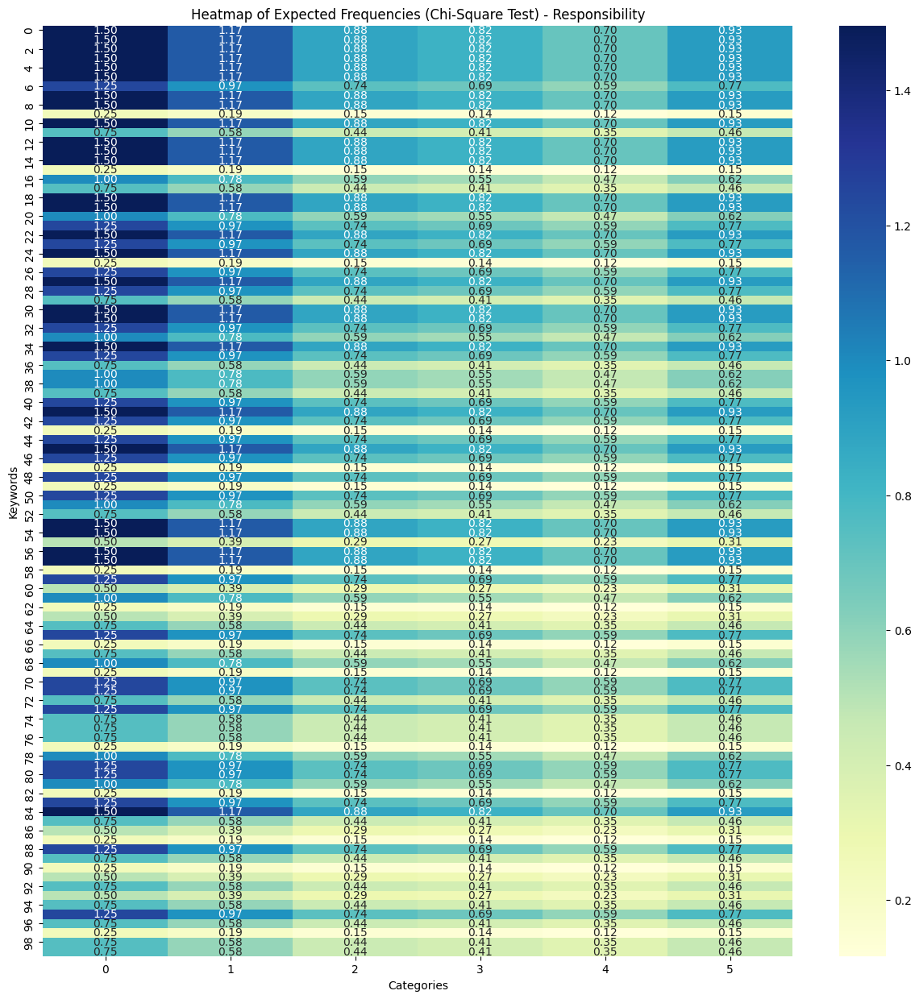

--------------------------------------------------
Uji chi-square untuk kategori: Requirement
Chi-square: 137.14454707414055
P-value: 1.0
Degree of Freedom: 495


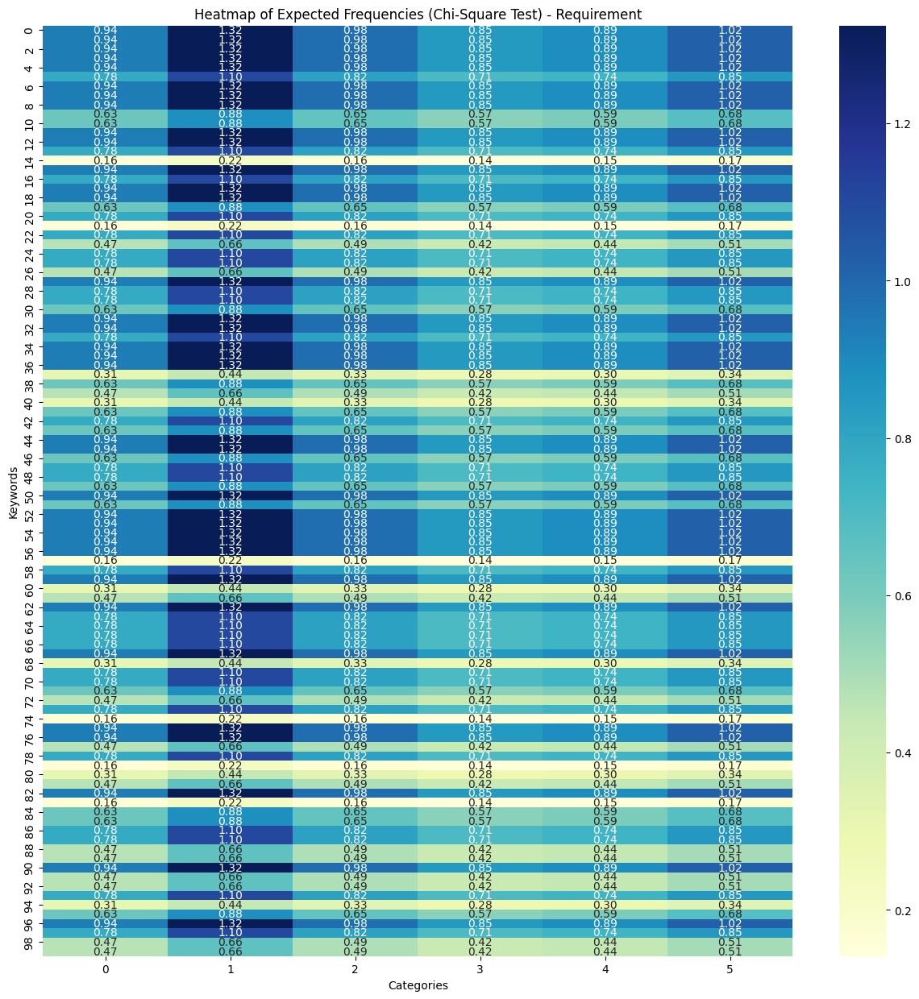

--------------------------------------------------
Uji chi-square untuk kategori: Skill
Chi-square: 159.74036694429677
P-value: 1.0
Degree of Freedom: 495


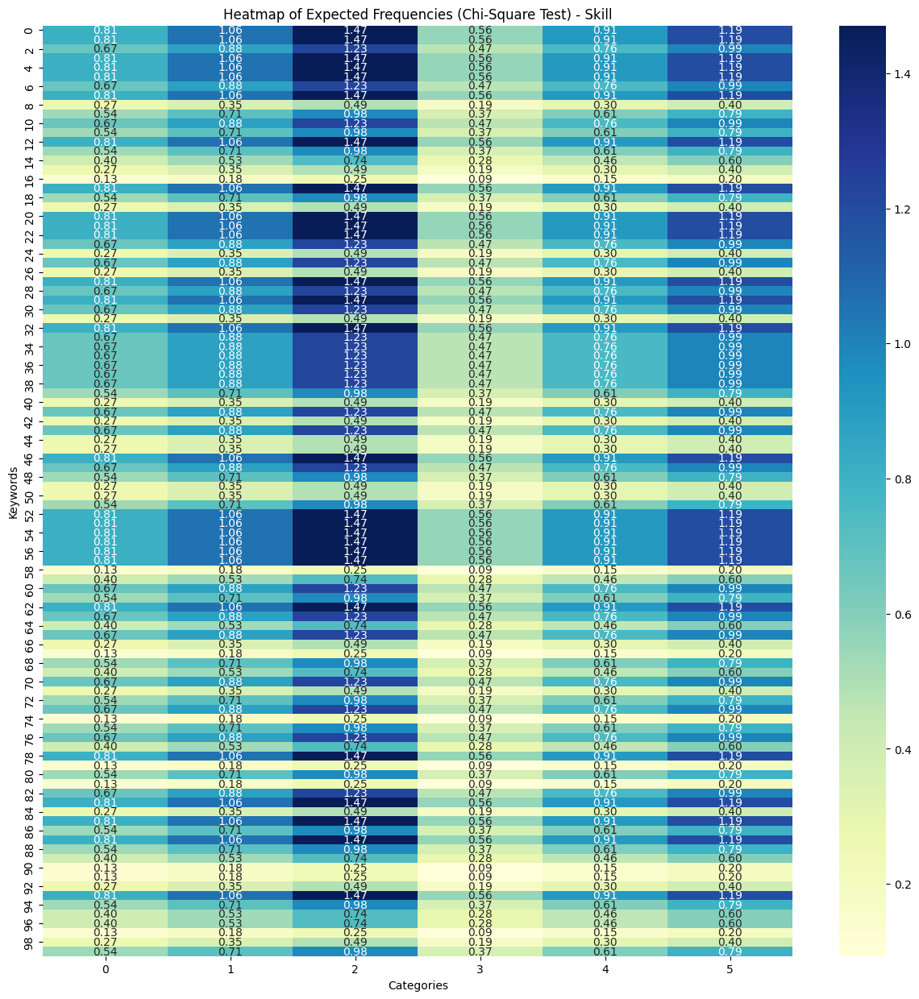

--------------------------------------------------
Uji chi-square untuk kategori: SoftSkill
Chi-square: 181.49359003092627
P-value: 1.0
Degree of Freedom: 495


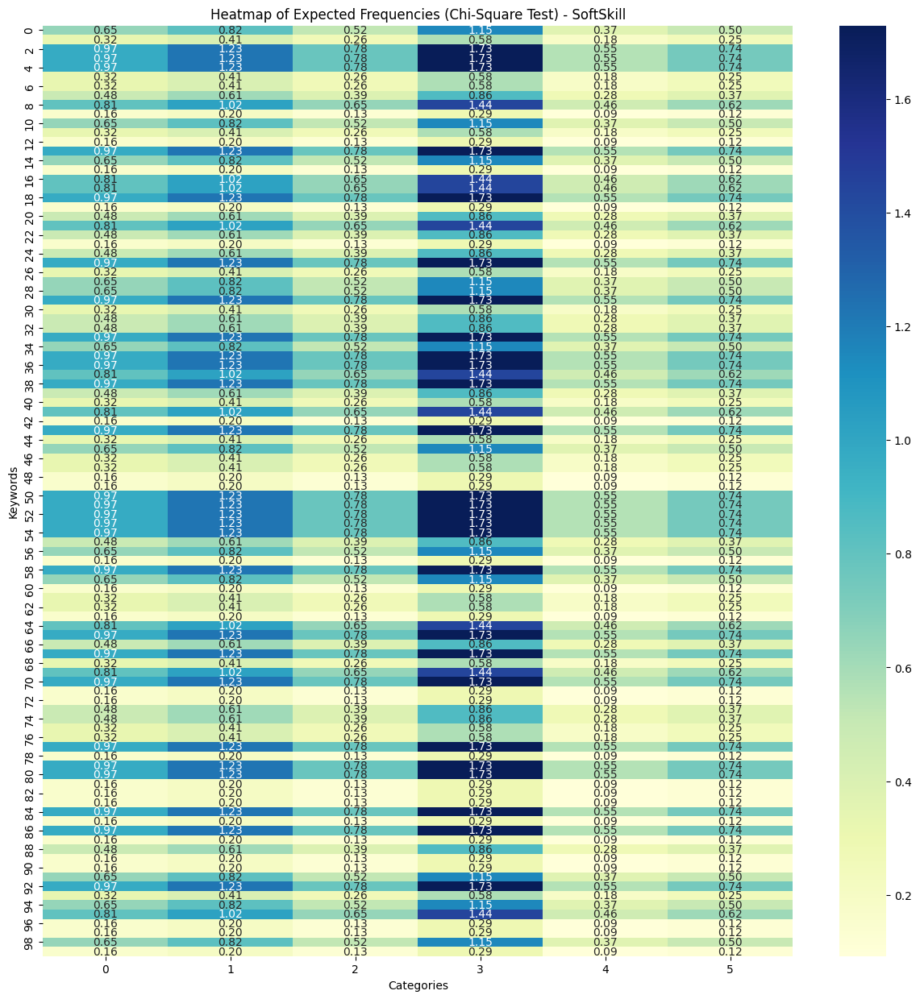

--------------------------------------------------
Uji chi-square untuk kategori: Education
Chi-square: 180.99446592874784
P-value: 1.0
Degree of Freedom: 495


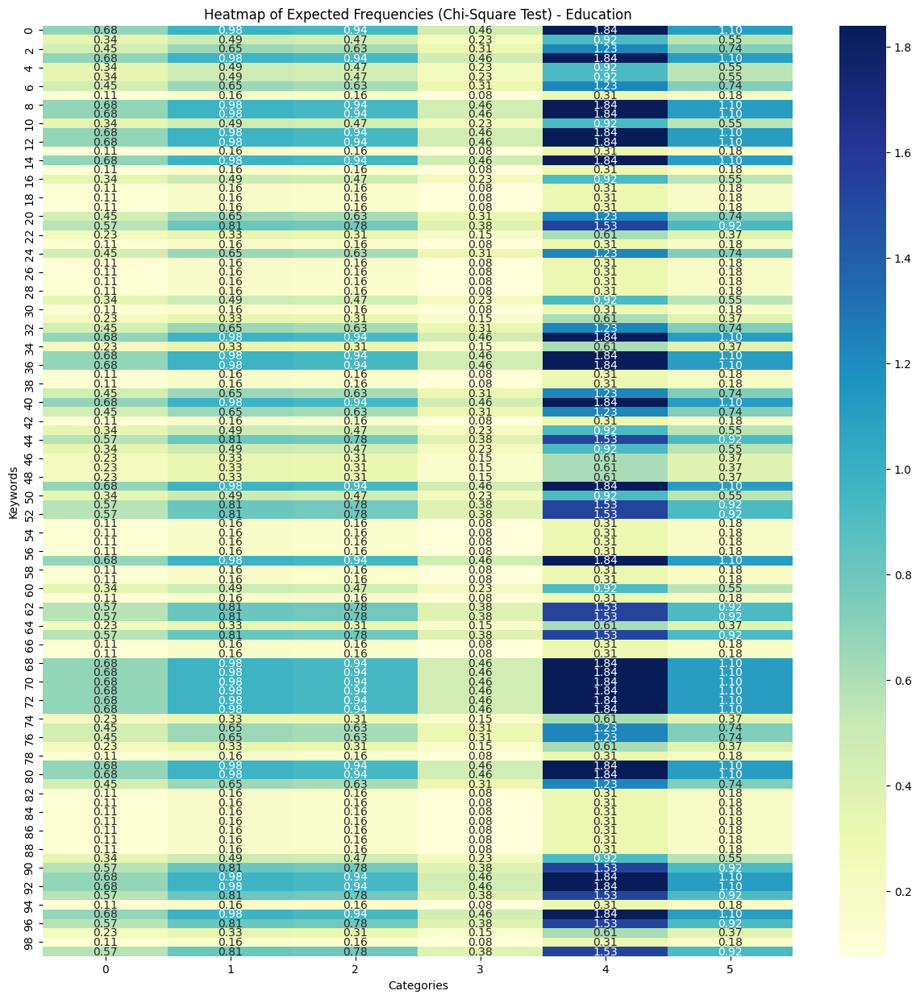

--------------------------------------------------
Uji chi-square untuk kategori: Experience
Chi-square: 131.43869546761215
P-value: 1.0
Degree of Freedom: 495


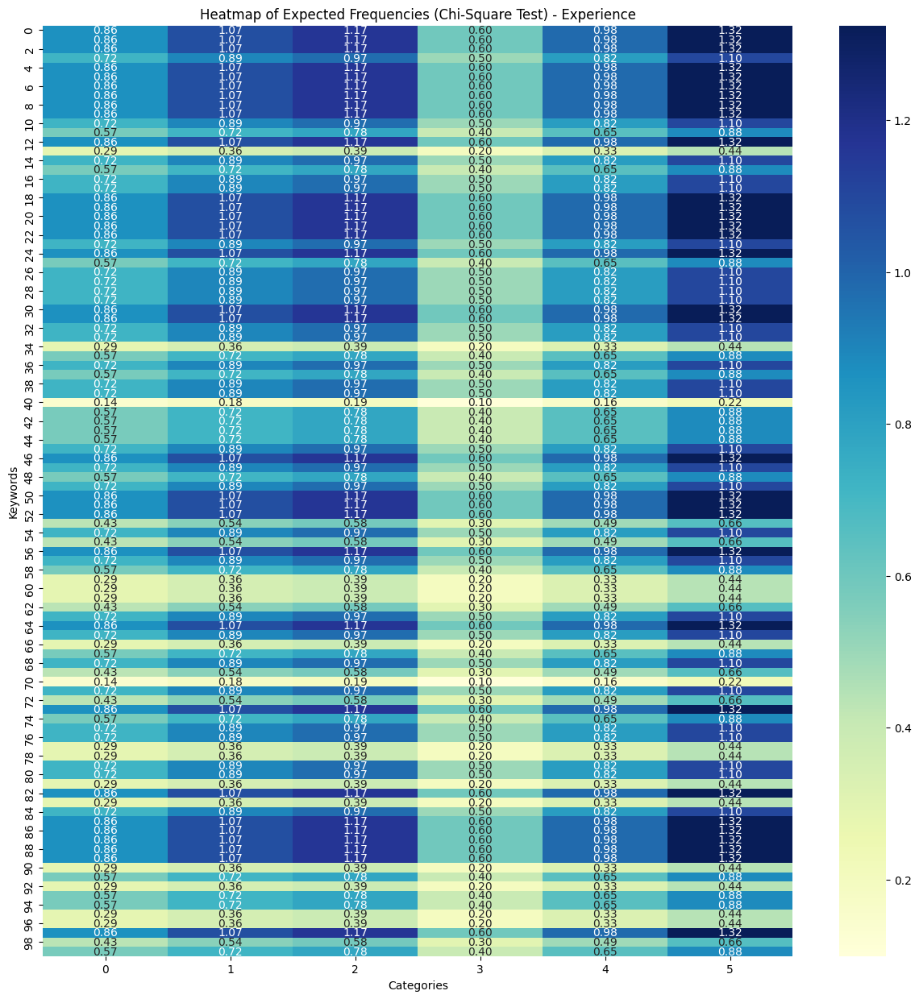

--------------------------------------------------


In [25]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from scipy import stats

def chi_square_test_with_visual(df, category, keywords_per_category):
    """
    Melakukan uji chi-square untuk mengetahui hubungan antara fitur dan target dan menampilkan visualisasi.
    Args:
    - df (pd.DataFrame): DataFrame yang berisi teks.
    - category (str): Kategori untuk dianalisis.
    - keywords_per_category (dict): Daftar kata per kategori.
    """
    # Filter data untuk kategori yang diberikan
    filtered_text = ' '.join(df[df['type'] == category]['new_sentence'].dropna())
    
    # Bersihkan teks
    cleaned_words = clean_text(filtered_text)
    
    if not cleaned_words:
        print(f"Tidak ada kata yang tersisa setelah pembersihan untuk kategori: {category}")
        return
    
    # Hitung frekuensi kata
    word_counts = Counter(cleaned_words)
    
    # Ambil 100 kata yang paling sering muncul
    most_common_words = word_counts.most_common(100)
    
    # Ambil kata-kata saja
    keywords = [word for word, count in most_common_words]
    
    # Membuat tabel kontingensi
    contingency_table = []
    for keyword in keywords:
        row = []
        for cat, words in keywords_per_category.items():
            row.append(keyword in words)
        contingency_table.append(row)
    
    # Melakukan uji chi-square
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
    print(f"Chi-square: {chi2}")
    print(f"P-value: {p}")
    print(f"Degree of Freedom: {dof}")
    
    # Tampilkan Expected Frequencies sebagai Heatmap
    plt.figure(figsize=(15, 15))
    sns.heatmap(expected, annot=True, fmt=".2f", cmap="YlGnBu", cbar=True)
    plt.title(f"Heatmap of Expected Frequencies (Chi-Square Test) - {category}")
    plt.xlabel("Categories")
    plt.ylabel("Keywords")
    plt.show()
    

# Contoh penggunaan
for category in custom_stopwords.keys():
    print(f"Uji chi-square untuk kategori: {category}")
    chi_square_test_with_visual(df, category, keywords_per_category)
    print("-" * 50)


Category: Responsibility
Chi-square: 40612.86103403031, P-value: 0.0, Degree of Freedom: 199


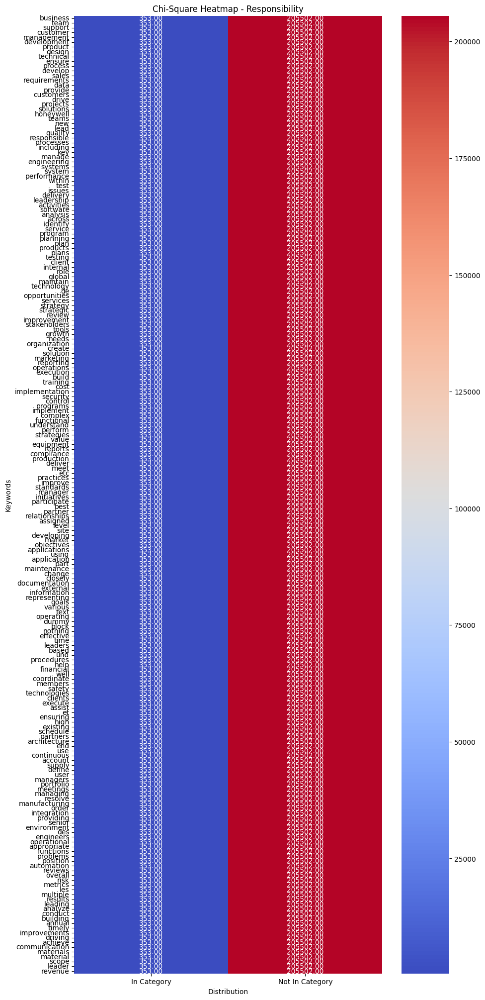

Category: Requirement
Chi-square: 18889.550356508196, P-value: 0.0, Degree of Freedom: 199


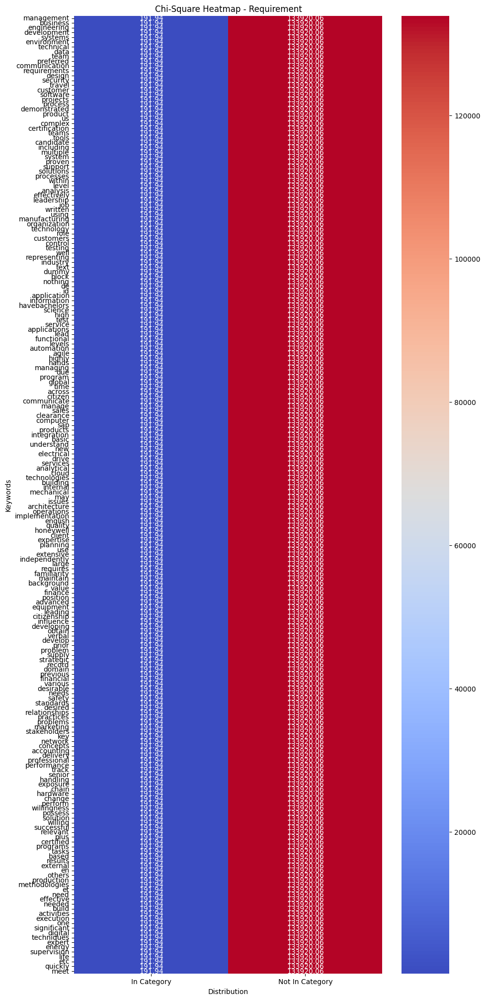

Category: Skill
Chi-square: 12143.947050117342, P-value: 0.0, Degree of Freedom: 199


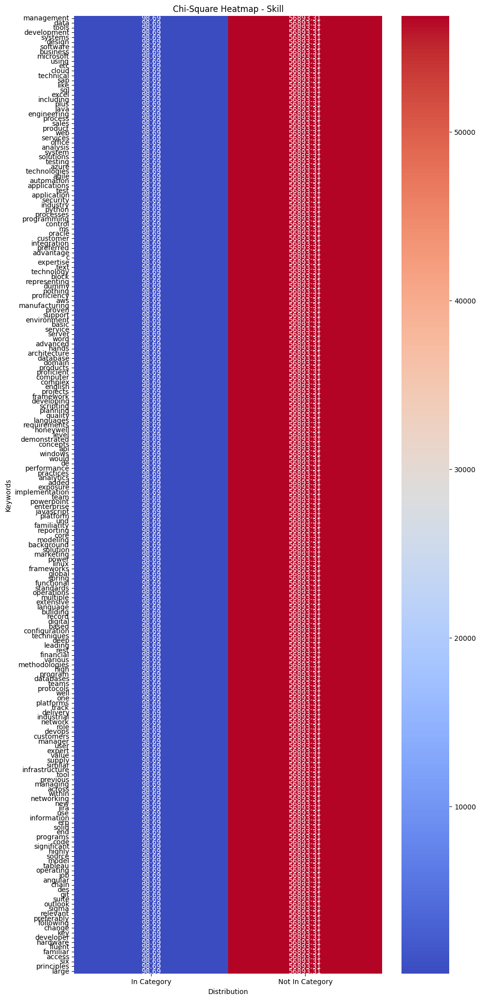

Category: SoftSkill
Chi-square: 33398.206352084744, P-value: 0.0, Degree of Freedom: 199


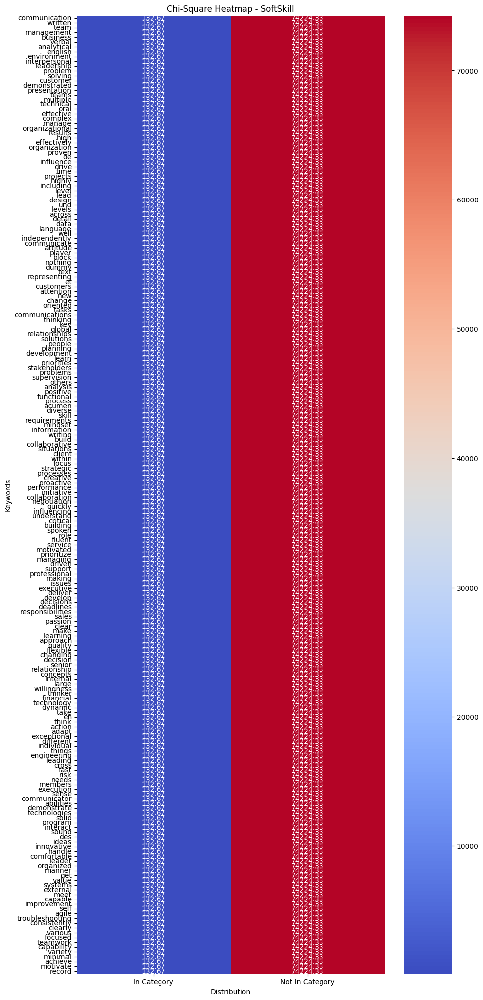

Category: Education
Chi-square: 70857.49676568582, P-value: 0.0, Degree of Freedom: 199


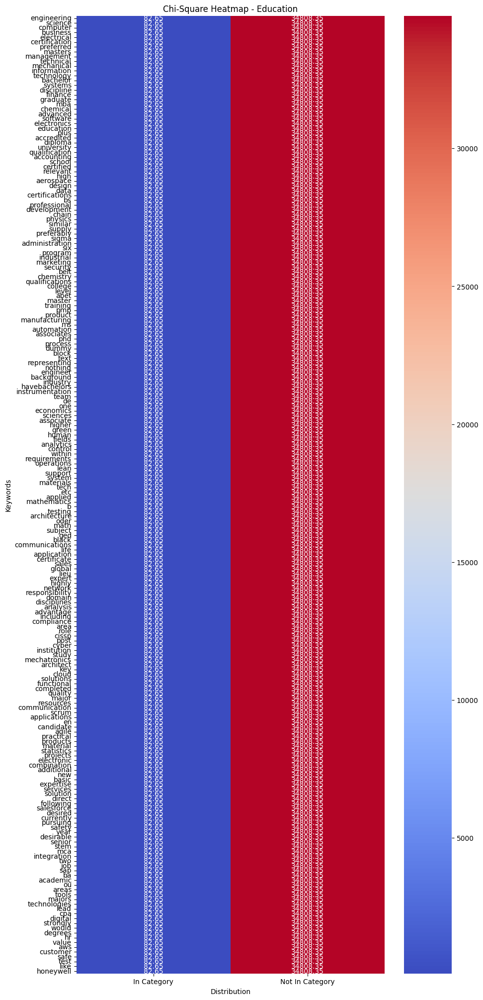

Category: Experience
Chi-square: 26438.66991335358, P-value: 0.0, Degree of Freedom: 199


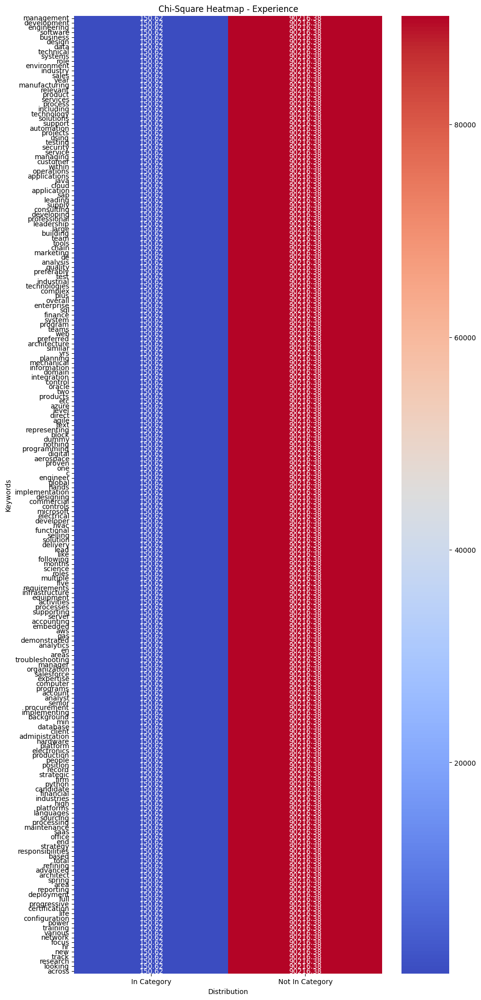

In [30]:
# Fungsi untuk membersihkan teks
def clean_text(text):
    """
    Membersihkan teks dari karakter khusus, angka, dan mengubahnya ke huruf kecil.
    """
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Hanya menyisakan huruf
    text = text.lower().split()  # Mengubah ke huruf kecil dan tokenisasi
    return [word for word in text if len(word) > 2]  # Hanya menyisakan kata dengan panjang > 2

# Fungsi uji chi-square
def chi_square_test_with_visual(df, category_col, text_col, keywords_per_category):
    """
    Melakukan uji chi-square dan visualisasi heatmap.
    Args:
    - df (pd.DataFrame): DataFrame yang berisi data teks.
    - category_col (str): Nama kolom kategori.
    - text_col (str): Nama kolom teks.
    - keywords_per_category (dict): Kata kunci per kategori.
    """
    for category, keywords in keywords_per_category.items():
        # Gabungkan semua teks dalam kategori
        filtered_text = ' '.join(df[df[category_col] == category][text_col].dropna())
        cleaned_words = clean_text(filtered_text)

        if not cleaned_words:
            print(f"Tidak ada kata yang tersisa setelah pembersihan untuk kategori: {category}")
            continue

        # Hitung frekuensi kata dalam kategori
        word_counts = Counter(cleaned_words)

        # Ambil kata-kata yang sesuai dengan daftar kata kunci
        contingency_table = []
        for keyword in keywords:
            in_category = word_counts.get(keyword, 0)  # Jumlah kata dalam kategori ini
            not_in_category = sum(word_counts.values()) - in_category  # Jumlah kata lainnya
            contingency_table.append([in_category, not_in_category])

        # Uji chi-square
        contingency_table = np.array(contingency_table)
        chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
        print(f"Category: {category}")
        print(f"Chi-square: {chi2}, P-value: {p}, Degree of Freedom: {dof}")

        # Visualisasi hasil
        plt.figure(figsize=(10, 25))
        sns.heatmap(expected, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=["In Category", "Not In Category"], 
                    yticklabels=keywords)
        plt.title(f"Chi-Square Heatmap - {category}")
        plt.xlabel("Distribution")
        plt.ylabel("Keywords")
        plt.show()

# Contoh penggunaan
keywords_per_category = {
    'Responsibility': ['business', 'team', 'support', 'customer', 'management', 'development', 'product', 'design', 'technical', 'ensure', 'process', 'develop', 'sales', 'requirements', 'data', 'provide', 'customers', 'drive', 'projects', 'solutions', 'honeywell', 'teams', 'new', 'lead', 'quality', 'responsible', 'processes', 'including', 'key', 'manage', 'engineering', 'systems', 'system', 'performance', 'within', 'test', 'issues', 'delivery', 'leadership', 'activities', 'software', 'analysis', 'across', 'identify', 'service', 'program', 'planning', 'plan', 'products', 'plans', 'testing', 'client', 'internal', 'role', 'global', 'maintain', 'technology', 'de', 'opportunities', 'services', 'strategy', 'strategic', 'review', 'improvement', 'stakeholders', 'tools', 'growth', 'needs', 'organization', 'create', 'solution', 'marketing', 'reporting', 'operations', 'execution', 'build', 'training', 'cost', 'implementation', 'security', 'control', 'programs', 'implement', 'complex', 'functional', 'understand', 'perform', 'strategies', 'value', 'equipment', 'reports', 'compliance', 'production', 'deliver', 'meet', 'etc', 'practices', 'improve', 'standards', 'manager', 'initiatives', 'participate', 'best', 'partner', 'relationships', 'assigned', 'level', 'site', 'developing', 'market', 'objectives', 'applications', 'using', 'application', 'part', 'maintenance', 'change', 'closely', 'documentation', 'external', 'information', 'representing', 'goals', 'various', 'text', 'operating', 'dummy', 'block', 'nothing', 'effective', 'time', 'leaders', 'based', 'und', 'procedures', 'help', 'financial', 'well', 'coordinate', 'members', 'safety', 'technologies', 'clients', 'execute', 'assist', 'et', 'ensuring', 'high', 'existing', 'schedule', 'partners', 'architecture', 'end', 'use', 'continuous', 'account', 'supply', 'define', 'user', 'managers', 'portfolio', 'meetings', 'managing', 'resolve', 'manufacturing', 'order', 'integration', 'providing', 'senior', 'environment', 'des', 'engineers', 'operational', 'appropriate', 'functions', 'problems', 'position', 'automation', 'reviews', 'overall', 'risk', 'metrics', 'les', 'multiple', 'results', 'leading', 'analyze', 'conduct', 'building', 'annual', 'timely', 'improvements', 'driving', 'achieve', 'communication', 'materials', 'material', 'scope', 'leader', 'revenue'],
    'Requirement': ['management', 'business', 'engineering', 'development', 'systems', 'environment', 'technical', 'data', 'team', 'preferred', 'communication', 'requirements', 'design', 'security', 'travel', 'customer', 'software', 'projects', 'process', 'demonstrated', 'product', 'us', 'complex', 'certification', 'teams', 'tools', 'candidate', 'including', 'multiple', 'system', 'proven', 'support', 'solutions', 'processes', 'within', 'level', 'analysis', 'effectively', 'leadership', 'job', 'written', 'using', 'manufacturing', 'organization', 'technology', 'role', 'customers', 'control', 'testing', 'well', 'representing', 'industry', 'text', 'dummy', 'block', 'nothing', 'de', 'id', 'application', 'information', 'havebachelors', 'science', 'high', 'test', 'service', 'applications', 'lead', 'functional', 'levels', 'automation', 'agile', 'highly', 'hands', 'managing', 'due', 'program', 'global', 'time', 'across', 'citizen', 'communicate', 'manage', 'sales', 'clearance', 'computer', 'sap', 'products', 'integration', 'basic', 'understand', 'new', 'electrical', 'drive', 'services', 'analytical', 'cloud', 'technologies', 'building', 'internal', 'mechanical', 'may', 'issues', 'architecture', 'operations', 'implementation', 'english', 'quality', 'honeywell', 'client', 'expertise', 'planning', 'use', 'extensive', 'independently', 'large', 'requires', 'familiarity', 'maintain', 'background', 'value', 'finance', 'position', 'advanced', 'equipment', 'leading', 'citizenship', 'influence', 'developing', 'obtain', 'verbal', 'develop', 'prior', 'problem', 'supply', 'strategic', 'record', 'domain', 'previous', 'financial', 'various', 'desirable', 'needs', 'safety', 'standards', 'desired', 'relationships', 'practices', 'problems', 'marketing', 'stakeholders', 'key', 'network', 'concepts', 'accounting', 'delivery', 'professional', 'performance', 'track', 'senior', 'handling', 'exposure', 'chain', 'hardware', 'change', 'perform', 'willingness', 'possess', 'solution', 'willing', 'successful', 'relevant', 'plus', 'certified', 'programs', 'tasks', 'based', 'results', 'external', 'en', 'others', 'production', 'methodologies', 'et', 'need', 'effective', 'needed', 'build', 'activities', 'execution', 'one', 'significant', 'digital', 'techniques', 'expert', 'energy', 'supervision', 'life', 'etc', 'quickly', 'meet'],
    'Skill': ['management', 'data', 'tools', 'development', 'systems', 'design', 'software', 'business', 'microsoft', 'using', 'etc', 'cloud', 'technical', 'sap', 'like', 'sql', 'excel', 'including', 'plus', 'java', 'engineering', 'process', 'sales', 'product', 'web', 'services', 'office', 'analysis', 'system', 'solutions', 'testing', 'azure', 'technologies', 'agile', 'automation', 'applications', 'test', 'application', 'security', 'industry', 'python', 'processes', 'programming', 'control', 'ms', 'oracle', 'customer', 'integration', 'preferred', 'advantage', 'c', 'expertise', 'text', 'technology', 'block', 'representing', 'dummy', 'nothing', 'proficiency', 'aws', 'manufacturing', 'proven', 'support', 'environment', 'basic', 'service', 'server', 'word', 'advanced', 'hands', 'architecture', 'database', 'domain', 'products', 'proficient', 'computer', 'complex', 'english', 'projects', 'framework', 'developing', 'scripting', 'planning', 'quality', 'languages', 'requirements', 'honeywell', 'level', 'demonstrated', 'concepts', 'api', 'windows', 'would', 'de', 'performance', 'practices', 'analytics', 'added', 'exposure', 'implementation', 'team', 'powerpoint', 'enterprise', 'javascript', 'platform', 'und', 'familiarity', 'reporting', 'core', 'modeling', 'background', 'solution', 'marketing', 'power', 'linux', 'frameworks', 'global', 'spring', 'functional', 'standards', 'operations', 'multiple', 'extensive', 'language', 'building', 'record', 'digital', 'based', 'configuration', 'techniques', 'deep', 'leading', 'rest', 'financial', 'various', 'methodologies', 'high', 'program', 'databases', 'teams', 'protocols', 'well', 'one', 'platforms', 'track', 'delivery', 'industrial', 'network', 'role', 'devops', 'customers', 'manager', 'user', 'expert', 'value', 'supply', 'similar', 'infrastructure', 'tool', 'previous', 'managing', 'across', 'within', 'networking', 'new', 'jira', 'use', 'information', 'erp', 'solid', 'end', 'programs', 'code', 'significant', 'highly', 'source', 'model', 'tableau', 'operating', 'job', 'angular', 'chain', 'des', 'git', 'suite', 'outlook', 'sigma', 'relevant', 'preferably', 'following', 'change', 'key', 'developer', 'hardware', 'fluent', 'familiar', 'access', 'six', 'principles', 'large'],
    'SoftSkill': ['communication', 'written', 'team', 'management', 'business', 'verbal', 'analytical', 'english', 'environment', 'interpersonal', 'leadership', 'problem', 'solving', 'customer', 'demonstrated', 'presentation', 'teams', 'multiple', 'technical', 'oral', 'effective', 'complex', 'manage', 'organizational', 'results', 'high', 'effectively', 'organization', 'proven', 'de', 'influence', 'drive', 'time', 'projects', 'highly', 'including', 'level', 'lead', 'design', 'und', 'levels', 'across', 'detail', 'data', 'language', 'well', 'independently', 'communicate', 'attitude', 'player', 'block', 'nothing', 'dummy', 'text', 'representing', 'et', 'customers', 'attention', 'new', 'change', 'oriented', 'tasks', 'communications', 'thinking', 'key', 'global', 'relationships', 'solutions', 'people', 'planning', 'development', 'learn', 'priorities', 'stakeholders', 'problems', 'supervision', 'others', 'analysis', 'positive', 'functional', 'process', 'acumen', 'diverse', 'skill', 'requirements', 'mindset', 'information', 'writing', 'build', 'collaborative', 'situations', 'client', 'within', 'focus', 'strategic', 'processes', 'creative', 'proactive', 'performance', 'initiative', 'collaboration', 'negotiation', 'quickly', 'influencing', 'understand', 'critical', 'building', 'spoken', 'role', 'fluent', 'service', 'motivated', 'prioritize', 'managing', 'driven', 'support', 'professional', 'making', 'issues', 'executive', 'deliver', 'develop', 'decisions', 'deadlines', 'responsibilities', 'sales', 'passion', 'clear', 'make', 'learning', 'approach', 'quality', 'flexible', 'changing', 'decision', 'senior', 'relationship', 'concepts', 'internal', 'large', 'willingness', 'thinker', 'financial', 'technology', 'dynamic', 'take', 'en', 'think', 'action', 'adapt', 'exceptional', 'different', 'individual', 'things', 'engineering', 'leading', 'cross', 'fast', 'risk', 'needs', 'members', 'execution', 'sense', 'communicator', 'abilities', 'demonstrate', 'technologies', 'solid', 'program', 'interact', 'sound', 'des', 'ideas', 'innovative', 'handle', 'comfortable', 'leader', 'organized', 'manner', 'get', 'value', 'systems', 'external', 'meet', 'capable', 'improvement', 'self', 'agile', 'troubleshooting', 'consistently', 'clearly', 'various', 'focused', 'teamwork', 'capability', 'variety', 'minimal', 'achieve', 'motivate', 'record'],
    'Education': ['engineering', 'science', 'computer', 'business', 'electrical', 'certification', 'preferred', 'masters', 'management', 'technical', 'mechanical', 'information', 'technology', 'bachelor', 'systems', 'discipline', 'finance', 'graduate', 'mba', 'chemical', 'advanced', 'software', 'electronics', 'education', 'plus', 'accredited', 'diploma', 'university', 'qualification', 'accounting', 'school', 'certified', 'relevant', 'high', 'aerospace', 'design', 'data', 'certifications', 'bs', 'professional', 'development', 'chain', 'physics', 'similar', 'supply', 'preferably', 'sigma', 'administration', 'six', 'program', 'industrial', 'marketing', 'security', 'belt', 'chemistry', 'qualifications', 'college', 'level', 'abet', 'master', 'training', 'pmp', 'product', 'manufacturing', 'ms', 'automation', 'associates', 'phd', 'process', 'dummy', 'block', 'text', 'representing', 'nothing', 'engineer', 'background', 'industry', 'havebachelors', 'instrumentation', 'team', 'de', 'one', 'economics', 'sciences', 'associate', 'higher', 'green', 'human', 'fields', 'analytics', 'control', 'within', 'requirements', 'operations', 'lean', 'support', 'system', 'materials', 'tech', 'etc', 'applied', 'mathematics', 'b', 'testing', 'architecture', 'oder', 'math', 'subject', 'ged', 'black', 'communications', 'life', 'application', 'certificate', 'sales', 'global', 'lieu', 'expert', 'highly', 'network', 'responsibility', 'domain', 'disciplines', 'analysis', 'advantage', 'including', 'compliance', 'area', 'role', 'cissp', 'post', 'cyber', 'institution', 'study', 'mechatronics', 'architect', 'key', 'cloud', 'solutions', 'functional', 'completed', 'quality', 'major', 'resources', 'communication', 'scrum', 'applications', 'en', 'candidate', 'agile', 'practical', 'products', 'material', 'statistics', 'projects', 'electronic', 'combination', 'additional', 'new', 'basic', 'expertise', 'services', 'solution', 'direct', 'following', 'salesforce', 'desired', 'currently', 'pursuing', 'safety', 'year', 'desirable', 'senior', 'stem', 'mca', 'integration', 'two', 'job', 'sap', 'ba', 'academic', 'ou', 'areas', 'tools', 'majors', 'technologies', 'lead', 'cpa', 'digital', 'strongly', 'would', 'degrees', 'hr', 'value', 'aws', 'customer', 'safe', 'test', 'like', 'honeywell'],
    'Experience': ['management', 'development', 'engineering', 'software', 'business', 'design', 'data', 'technical', 'systems', 'role', 'environment', 'industry', 'sales', 'year', 'manufacturing', 'relevant', 'product', 'services', 'process', 'including', 'technology', 'solutions', 'support', 'automation', 'projects', 'using', 'testing', 'security', 'service', 'managing', 'customer', 'within', 'operations', 'applications', 'java', 'cloud', 'application', 'sap', 'leading', 'supply', 'consulting', 'developing', 'professional', 'leadership', 'large', 'building', 'team', 'tools', 'chain', 'marketing', 'de', 'analysis', 'quality', 'preferably', 'test', 'industrial', 'technologies', 'complex', 'plus', 'overall', 'enterprise', 'sql', 'finance', 'system', 'program', 'teams', 'web', 'preferred', 'architecture', 'similar', 'yrs', 'planning', 'mechanical', 'information', 'domain', 'integration', 'control', 'oracle', 'two', 'products', 'etc', 'azure', 'level', 'direct', 'agile', 'text', 'representing', 'block', 'dummy', 'nothing', 'programming', 'digital', 'aerospace', 'proven', 'one', 'c', 'engineer', 'global', 'hands', 'implementation', 'designing', 'commercial', 'controls', 'microsoft', 'electrical', 'developer', 'hvac', 'functional', 'selling', 'solution', 'delivery', 'lead', 'like', 'following', 'months', 'science', 'roles', 'multiple', 'five', 'requirements', 'infrastructure', 'equipment', 'activities', 'processes', 'supporting', 'server', 'accounting', 'embedded', 'aws', 'gas', 'demonstrated', 'analytics', 'en', 'areas', 'troubleshooting', 'manager', 'organization', 'salesforce', 'expertise', 'computer', 'programs', 'account', 'analyst', 'senior', 'procurement', 'implementing', 'background', 'min', 'database', 'client', 'administration', 'hardware', 'platform', 'electronics', 'production', 'people', 'position', 'record', 'strategic', 'firm', 'python', 'candidate', 'financial', 'industries', 'high', 'platforms', 'languages', 'sourcing', 'processing', 'maintenance', 'saas', 'office', 'end', 'strategy', 'responsibilities', 'based', 'total', 'refining', 'advanced', 'architect', 'spring', 'area', 'reporting', 'deployment', 'full', 'progressive', 'certification', 'life', 'configuration', 'power', 'training', 'various', 'network', 'focus', 'hr', 'new', 'track', 'research', 'looking', 'across']
}

# Menjalankan uji chi-square pada hasil one-hot encoding
chi_square_test_with_visual(df, 'type', 'new_sentence', keywords_per_category)


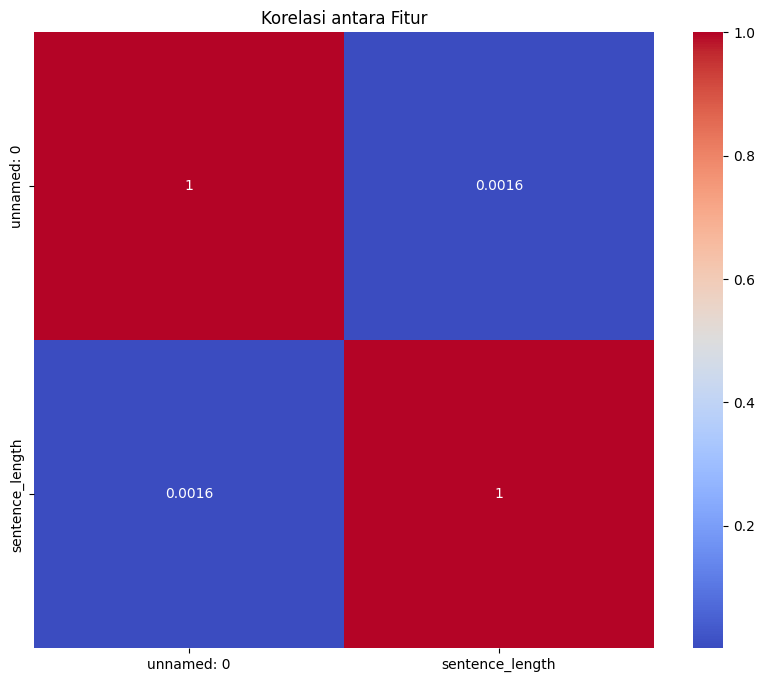

In [36]:
# Pilih hanya kolom numerik untuk analisis korelasi
numerical_data = one_hot_encoded_data.select_dtypes(include=[np.number])

# Analisis korelasi
correlation_matrix = numerical_data.corr()

# Visualisasi korelasi
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Korelasi antara Fitur')
plt.show()


The correlation results above show a value of 0.0016 for the correlation between sentence length and index. It can be concluded that the absence of a very strong correlation indicates that the two features are closely related and may influence each other.


In [39]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Check the columns of one_hot_encoded_data
print(one_hot_encoded_data.columns)

# Ensure all features are numeric
X = one_hot_encoded_data.select_dtypes(include=[np.number]).drop(['type_Skill'], axis=1, errors='ignore')
y = one_hot_encoded_data['type_Skill'] if 'type_Skill' in one_hot_encoded_data.columns else None

if y is not None:
	# Split data
	X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

	# Model regresi logistik
	model = LogisticRegression(max_iter=1000)
	model.fit(X_train, y_train)

	# Evaluasi
	y_pred = model.predict(X_test)
	print(classification_report(y_test, y_pred))
else:
	print("Column 'type_Skill' not found in the DataFrame.")


Index(['unnamed: 0', 'sentence_id', 'new_sentence', 'sentence_length',
       'type_Education', 'type_Experience', 'type_Requirement',
       'type_Responsibility', 'type_Skill', 'type_SoftSkill'],
      dtype='object')
              precision    recall  f1-score   support

       False       0.88      1.00      0.94     15629
        True       0.00      0.00      0.00      2072

    accuracy                           0.88     17701
   macro avg       0.44      0.50      0.47     17701
weighted avg       0.78      0.88      0.83     17701



/Users/tatas/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/tatas/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/tatas/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



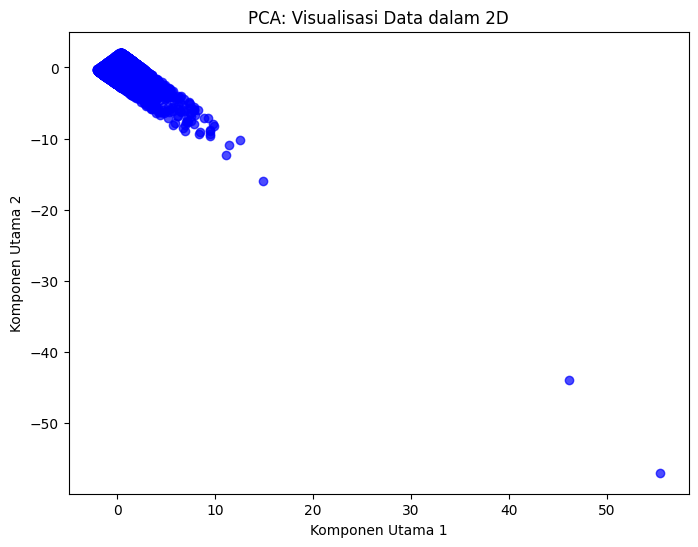

In [42]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Pilih hanya kolom numerik untuk normalisasi
numeric_data = one_hot_encoded_data.select_dtypes(include=[np.number])

# Normalisasi data
scaled_data = StandardScaler().fit_transform(numeric_data)

# PCA
pca = PCA(n_components=2)  # Mengambil 2 komponen utama
pca_result = pca.fit_transform(scaled_data)

# Visualisasi hasil PCA
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c='blue', alpha=0.7)
plt.title('PCA: Visualisasi Data dalam 2D')
plt.xlabel('Komponen Utama 1')
plt.ylabel('Komponen Utama 2')
plt.show()


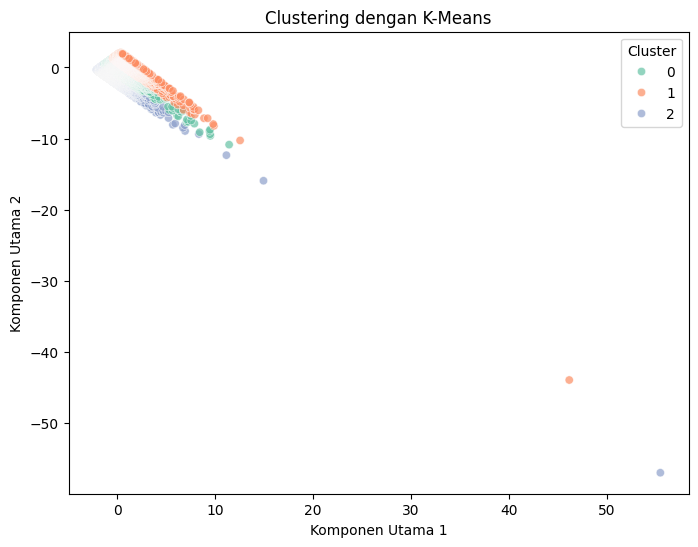

In [44]:
from sklearn.cluster import KMeans

# Ensure all features are numeric
numeric_data = one_hot_encoded_data.select_dtypes(include=[np.number])

# Clustering dengan K-Means
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(numeric_data)

# Menambahkan hasil clustering ke data
one_hot_encoded_data['cluster'] = clusters

# Visualisasi clustering
plt.figure(figsize=(8, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='Set2', alpha=0.7)
plt.title('Clustering dengan K-Means')
plt.xlabel('Komponen Utama 1')
plt.ylabel('Komponen Utama 2')
plt.legend(title='Cluster')
plt.show()


#### 2.NGRAM ANALYTICS

In [79]:
from sklearn.feature_extraction.text import CountVectorizer

# Menggabungkan semua teks dalam kolom 'new_sentence'
all_text = ' '.join(df['new_sentence'].dropna())

# Membuat CountVectorizer untuk n-gram (misalnya bigram)
vectorizer = CountVectorizer(ngram_range=(2, 2))  # Menggunakan bigram
X = vectorizer.fit_transform([all_text])

# Mendapatkan frekuensi n-gram
ngram_freq = X.toarray().flatten()
ngram_features = vectorizer.get_feature_names_out()

# Membuat DataFrame untuk menampilkan hasil
ngram_df = pd.DataFrame({'ngram': ngram_features, 'frequency': ngram_freq})
ngram_df = ngram_df.sort_values(by='frequency', ascending=False)

# Menampilkan 10 n-gram yang paling sering muncul
print(ngram_df.head(10))

                   ngram  frequency
76396      experience in       5833
224985          years of       4855
1770          ability to       4678
134602     of experience       2614
76984    experience with       2322
52741          degree in       2168
110499      knowledge of       1804
136062            of the       1679
99214             in the       1626
24152   bachelors degree       1588


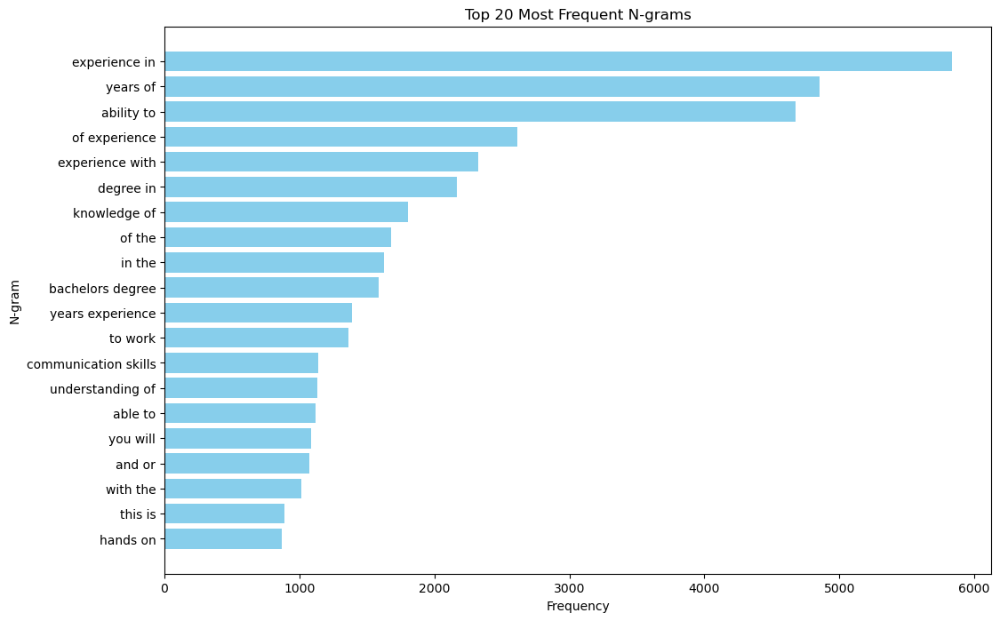

In [81]:
import matplotlib.pyplot as plt

# Select the top 20 most frequent n-grams
top_ngrams = ngram_df.head(20)

# Plot the bar chart
plt.figure(figsize=(12, 8))
plt.barh(top_ngrams['ngram'], top_ngrams['frequency'], color='skyblue')
plt.xlabel('Frequency')
plt.ylabel('N-gram')
plt.title('Top 20 Most Frequent N-grams')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest frequency at the top
plt.show()

The graph shows the 20 most frequently occurring word combinations (n-grams) in a text corpus. The most frequently occurring phrases are "experience in," "years of," and "ability to," which focus on a person's experience, skills, and knowledge.


In [83]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Initialize the CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

# Fit and transform the new_sentence column
X = vectorizer.fit_transform(df['new_sentence'].dropna())

# Sum up the counts of each vocabulary word
word_counts = X.sum(axis=0).A1
vocab = vectorizer.get_feature_names_out()

# Create a DataFrame with the word counts
word_count_df = pd.DataFrame({'word': vocab, 'count': word_counts})

# Sort the DataFrame by count in descending order
word_count_df = word_count_df.sort_values(by='count', ascending=False)

# Display the top 20 most frequent words
print(word_count_df.head(20))

              word  count
7104    experience  16175
20856        years   8165
17464       skills   5266
507        ability   4879
2873      business   4833
11350   management   4831
6538   engineering   4344
5065        degree   3743
20686         work   3687
10454    knowledge   3539
5314   development   3318
18619         team   3211
14745      project   2905
18165       strong   2898
18654    technical   2830
5233        design   2587
4735      customer   2509
4865          data   2504
20702      working   2290
18348      support   2269


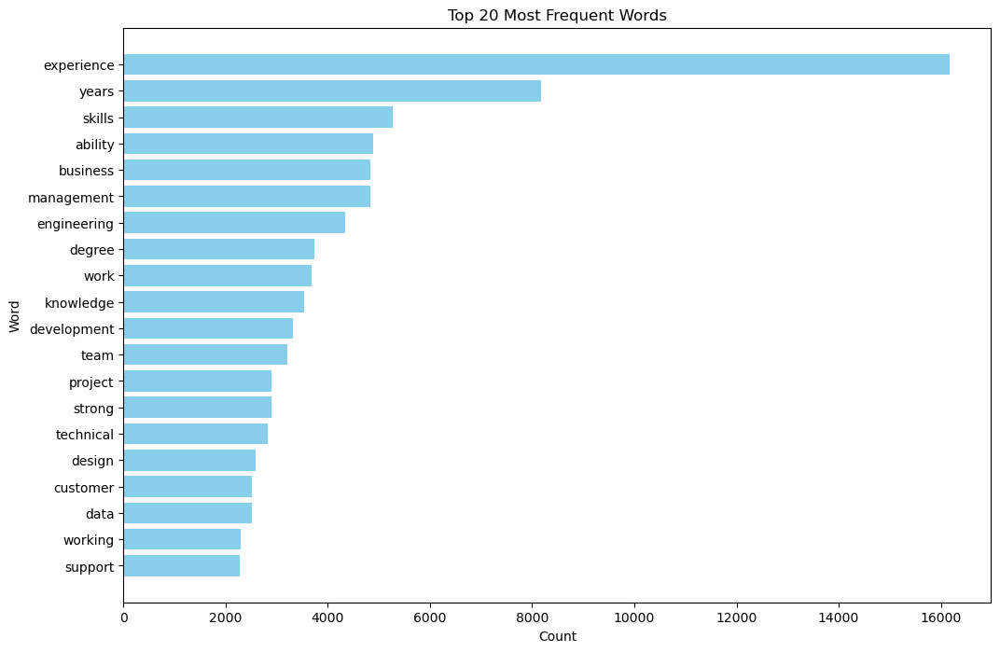

In [87]:
#make visualization
import matplotlib.pyplot as plt

# Select the top 20 most frequent words
top_words = word_count_df.head(20)

# Plot the bar chart
plt.figure(figsize=(12, 8))
plt.barh(top_words['word'], top_words['count'], color='skyblue')
plt.xlabel('Count')
plt.ylabel('Word')
plt.title('Top 20 Most Frequent Words')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest frequency at the top
plt.show()

[('author', 'review'), ('review', 'technical'), ('technical', 'documents'), ('documents', 'ensuring'), ('ensuring', 'high'), ('high', 'quality'), ('quality', 'deliverables'), ('deliverables', 'development'), ('development', 'across'), ('across', 'tech'), ('tech', 'stacks'), ('stacks', 'applications'), ('applications', 'teams')]


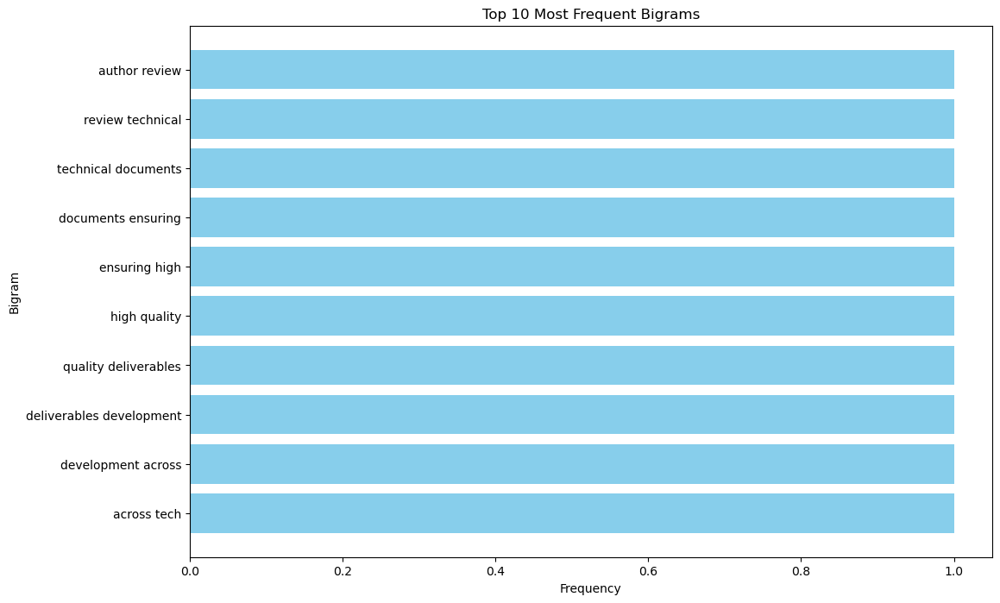

In [77]:
from nltk.util import ngrams
from collections import Counter

# Fungsi untuk membuat n-grams
def generate_ngrams(text, n=2):
    words = text.split()
    return list(ngrams(words, n))

# Contoh menghasilkan bigrams
sample_text = df['new_sentence'].iloc[0]
cleaned_sample = clean_text(sample_text)
cleaned_sample_str = ' '.join(cleaned_sample)  # Join the list of words back into a single string
bigrams = generate_ngrams(cleaned_sample_str, n=2)

print(bigrams)
# Output: [('data', 'analysis'), ('analysis', 'is'), ('is', 'the'), ('the', 'key'), ('key', 'to'), ('to', 'success')]

# mevisualisasikan bigram
bigram_counts = Counter(bigrams)
most_common_bigrams = bigram_counts.most_common(10)

# Plot the bar chart
plt.figure(figsize=(12, 8))
plt.barh([f"{bigram[0]} {bigram[1]}" for bigram, count in most_common_bigrams], 
         [count for bigram, count in most_common_bigrams], color='skyblue')
plt.xlabel('Frequency')
plt.ylabel('Bigram')
plt.title('Top 10 Most Frequent Bigrams')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest frequency at the top
plt.show()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


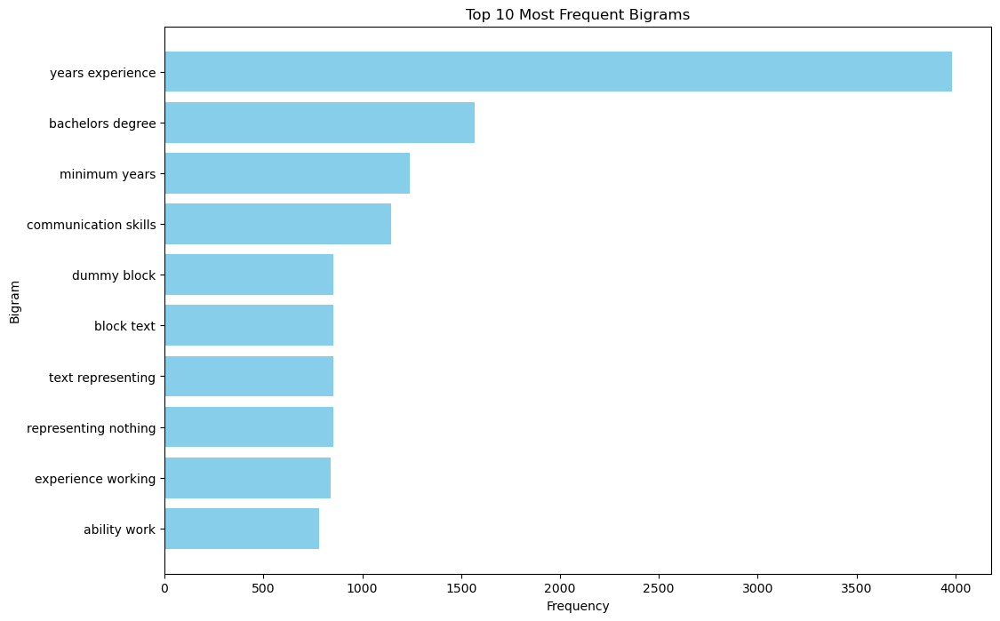

In [89]:
import nltk
from nltk.util import ngrams
from collections import Counter
import matplotlib.pyplot as plt

# Mengunduh stopwords jika belum diunduh
nltk.download('stopwords')
nltk.download('punkt')

# Mengatur stopwords
stop_words = set(nltk.corpus.stopwords.words('english'))

# Fungsi untuk membersihkan dan tokenisasi teks
def clean_text(text, custom_stopwords=None):
    # Mengubah teks menjadi huruf kecil
    text = text.lower()
    # Tokenisasi kata
    words = nltk.word_tokenize(text)
    # Menghapus stopwords
    if custom_stopwords:
        stop_words.update(custom_stopwords)
    words_cleaned = [word for word in words if word.isalpha() and word not in stop_words]
    return words_cleaned

# Fungsi untuk membuat n-grams
def generate_ngrams(text, n=2):
    words = text.split()
    return list(ngrams(words, n))

# Menggabungkan dan membersihkan teks dari seluruh kolom 'new_sentence'
all_sentences = ' '.join(df['new_sentence'].dropna())
cleaned_text = clean_text(all_sentences)
cleaned_text_str = ' '.join(cleaned_text)  # Menggabungkan kembali daftar kata menjadi satu string

# Menghasilkan bigrams
bigrams = generate_ngrams(cleaned_text_str, n=2)

# Menghitung frekuensi bigram
bigram_counts = Counter(bigrams)
most_common_bigrams = bigram_counts.most_common(10)

# Memvisualisasikan bigram
plt.figure(figsize=(12, 8))
plt.barh([f"{bigram[0]} {bigram[1]}" for bigram, count in most_common_bigrams], 
         [count for bigram, count in most_common_bigrams], color='skyblue')
plt.xlabel('Frequency')
plt.ylabel('Bigram')
plt.title('Top 10 Most Frequent Bigrams')
plt.gca().invert_yaxis()  # Membalik sumbu y untuk menempatkan frekuensi tertinggi di atas
plt.show()


# THANK YOU